# "A STUDY ON UNDERNUTRITION IN NEW BORN CHILDREN OF INDIA"

by <b> Abhinav Baruah & Akhilesh Kumar </b>

<b>Objective</b> : Predict vulnarebility of a district to undernutrition.
<p><b>Dependent variables: </b>: % Children with birth weight below 2.5 kg </p>

In [6]:
# Load all required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pylab
import pandas_profiling
import scipy.stats as stats
import statsmodels.api as sm
import scipy.cluster.hierarchy as shc
from collections import Counter
from sklearn import decomposition
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import LocalOutlierFactor as lof
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import *
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

C:\ProgramData\Anaconda3\lib\site-packages\pandas_profiling\plot.py:15: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "C:\ProgramData\Anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\ProgramData\Anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\ProgramData\Anaconda3\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 499, in start
    self.io_loop.start()
  File "C:\ProgramDa

# Dataset

India - Annual Health Survey(AHS) 2012-13
<p>The survey was conducted in Empowered Action Group (EAG) states Uttarakhand, Rajasthan, Uttar Pradesh, Bihar, Jharkhand,
Odisha, Chhattisgarh & Madhya Pradesh and Assam.A representative sample of about 21 million population and 4.32 million households were covered 20k+ sample units which is spread across rural and urban area of these 9 states.</p>

In [2]:
#load the data
data=pd.read_csv("Final_District_Profile_Project.csv")
f_data=data.iloc[:,1:46]

In [3]:
f_data.head(10)

,State_Name,State_District_Name,BB_Average_Household_Size_St_Total,BB_Average_Household_Size_All_Total,BB_Currently_Married_Illiterate_Women_Aged_15_49_Years_Total,CC_Sex_Ratio_At_Birth_Total,CC_Sex_Ratio_All_Ages_Total,DD_Female_Total,EE_Marriages_Among_Females_Below_Legal_Age_18_Years_Total,EE_Currently_Married_Women_Aged_20_24_Years_Married_Before_Legal_Age_18_Years_Total,...,QQ_Delivery_At_Home_Total,QQ_Delivery_At_Home_Conducted_By_Skilled_Health_Personnel_Total,SS_Mothers_Who_Availed_Financial_Assistance_For_Delivery_Under_Jsy_Total,TT_Children_With_Birth_Weight_Less_Than_2_5_Kg_Total,UU_Children_Suffering_From_Diarrhoea_Total,UU_Children_Suffering_From_Acute_Respiratory_Infection_Total,UU_Children_Suffering_From_Fever_Total,YY_Infant_Mortality_Rate_Imr_Total_Person,AA_percent_urban,AA_Currently_Married_Women_Aged_15_49_Years_Total_percent
0,Assam,Barpeta,4.7,4.7,31.7,926.0,947.0,71.6,6.4,21.5,...,47.4,19.8,41.8,22.5,9.8,12.9,19.9,43.0,6.899570,18.382194
1,Assam,Bongaigaon,4.7,4.8,32.8,950.0,955.0,72.9,7.8,42.8,...,45.1,34.8,51.7,21.6,3.1,7.1,12.6,48.0,14.265992,18.489025
2,Assam,Cachar,4.1,4.6,20.0,928.0,995.0,80.3,3.9,24.2,...,34.9,35.7,53.0,27.8,12.7,9.0,30.8,53.0,11.936118,16.936410
3,Assam,Darrang,4.9,4.9,44.1,1003.0,955.0,66.8,8.5,40.5,...,36.6,24.0,54.3,25.2,9.6,12.9,24.3,70.0,3.058310,17.305839
4,Assam,Dhemaji,5.7,5.2,29.9,988.0,954.0,74.4,9.3,29.4,...,27.1,24.9,76.3,14.5,11.6,9.3,17.1,37.0,12.858228,17.930843
5,Assam,Dhubri,4.8,4.7,33.4,931.0,942.0,72.0,18.2,56.4,...,57.3,23.0,39.3,16.5,7.5,11.6,29.9,69.0,9.517317,18.626451
6,Assam,Dibrugarh,4.5,4.5,28.1,922.0,968.0,74.7,4.9,21.9,...,18.6,36.4,63.7,31.6,15.0,34.0,29.1,51.0,22.752362,18.543611
7,Assam,Goalpara,4.7,4.8,28.5,922.0,954.0,77.1,13.0,56.0,...,44.2,36.0,50.2,18.4,9.4,11.4,14.8,53.0,7.935309,18.833838
8,Assam,Golaghat,5.2,4.5,28.9,947.0,971.0,74.7,5.8,26.1,...,26.6,43.9,63.4,24.7,11.6,36.4,26.9,56.0,11.472442,18.511744
9,Assam,Hailakandi,4.8,5.0,22.2,822.0,952.0,80.4,6.8,31.4,...,57.8,24.4,39.2,28.2,28.8,20.5,42.4,52.0,15.024982,16.318745


In [4]:
#All the column names
for col in f_data.columns:
    print(col)

State_Name
State_District_Name
BB_Average_Household_Size_St_Total
BB_Average_Household_Size_All_Total
BB_Currently_Married_Illiterate_Women_Aged_15_49_Years_Total
CC_Sex_Ratio_At_Birth_Total
CC_Sex_Ratio_All_Ages_Total
DD_Female_Total
EE_Marriages_Among_Females_Below_Legal_Age_18_Years_Total
EE_Currently_Married_Women_Aged_20_24_Years_Married_Before_Legal_Age_18_Years_Total
EE_Mean_Age_At_Marriage_Female_Total
GG_Work_Participation_Rate_15_Years_And_Above_Female_Total
HH_Prevalence_Of_Any_Type_Of_Disability_Per_100000_Population_Person_Total
JJ_Persons_Suffering_From_Acute_Illness_Per_100000_Population_Diarrhoea_Dysentery_Person_Total
JJ_Persons_Suffering_From_Acute_Illness_Per_100000_Population_Acute_Respiratory_Infection_Ari_Person_Total
JJ_Persons_Suffering_From_Acute_Illness_And_Taking_Treatment_From_Any_Source_Person_Total
JJ_Persons_Suffering_From_Acute_Illness_And_Taking_Treatment_From_Government_Source_Person_Total
LL_Total_Fertility_Rate_Total
LL_Women_Aged_20_24_Reporting_Bir

In [7]:
#pandas profiling
pandas_profiling.ProfileReport(f_data)


Number of variables,45
Number of observations,284
Total Missing (%),0.0%
Total size in memory,99.9 KiB
Average record size in memory,360.3 B
Numeric,42
Categorical,1
Boolean,0
Date,0
Text (Unique),1
Rejected,1


In [8]:
# Dependent variable :  TT_Children_With_Birth_Weight_Less_Than_2_5_Kg_Total
Y=f_data['TT_Children_With_Birth_Weight_Less_Than_2_5_Kg_Total']

#dropping other dependent variables that we will use later

ff_data1=f_data.drop(['UU_Children_Suffering_From_Diarrhoea_Total',
       'UU_Children_Suffering_From_Acute_Respiratory_Infection_Total',
       'UU_Children_Suffering_From_Fever_Total',
       'YY_Infant_Mortality_Rate_Imr_Total_Person'],axis=1)
ff_data1.head(10)

,State_Name,State_District_Name,BB_Average_Household_Size_St_Total,BB_Average_Household_Size_All_Total,BB_Currently_Married_Illiterate_Women_Aged_15_49_Years_Total,CC_Sex_Ratio_At_Birth_Total,CC_Sex_Ratio_All_Ages_Total,DD_Female_Total,EE_Marriages_Among_Females_Below_Legal_Age_18_Years_Total,EE_Currently_Married_Women_Aged_20_24_Years_Married_Before_Legal_Age_18_Years_Total,...,PP_Mothers_Who_Had_Full_Antenatal_Check_Up_Total,PP_Mothers_Who_Received_Anc_From_Govt_Source_Total,QQ_Institutional_Delivery_Total,QQ_Delivery_At_Private_Institution_Total,QQ_Delivery_At_Home_Total,QQ_Delivery_At_Home_Conducted_By_Skilled_Health_Personnel_Total,SS_Mothers_Who_Availed_Financial_Assistance_For_Delivery_Under_Jsy_Total,TT_Children_With_Birth_Weight_Less_Than_2_5_Kg_Total,AA_percent_urban,AA_Currently_Married_Women_Aged_15_49_Years_Total_percent
0,Assam,Barpeta,4.7,4.7,31.7,926.0,947.0,71.6,6.4,21.5,...,14.0,89.6,52.3,7.3,47.4,19.8,41.8,22.5,6.899570,18.382194
1,Assam,Bongaigaon,4.7,4.8,32.8,950.0,955.0,72.9,7.8,42.8,...,16.3,92.9,54.8,5.5,45.1,34.8,51.7,21.6,14.265992,18.489025
2,Assam,Cachar,4.1,4.6,20.0,928.0,995.0,80.3,3.9,24.2,...,17.8,50.3,64.8,10.3,34.9,35.7,53.0,27.8,11.936118,16.936410
3,Assam,Darrang,4.9,4.9,44.1,1003.0,955.0,66.8,8.5,40.5,...,17.1,91.3,63.0,5.3,36.6,24.0,54.3,25.2,3.058310,17.305839
4,Assam,Dhemaji,5.7,5.2,29.9,988.0,954.0,74.4,9.3,29.4,...,11.0,92.4,72.3,2.7,27.1,24.9,76.3,14.5,12.858228,17.930843
5,Assam,Dhubri,4.8,4.7,33.4,931.0,942.0,72.0,18.2,56.4,...,7.6,94.1,42.4,3.1,57.3,23.0,39.3,16.5,9.517317,18.626451
6,Assam,Dibrugarh,4.5,4.5,28.1,922.0,968.0,74.7,4.9,21.9,...,29.3,66.3,81.2,26.5,18.6,36.4,63.7,31.6,22.752362,18.543611
7,Assam,Goalpara,4.7,4.8,28.5,922.0,954.0,77.1,13.0,56.0,...,14.6,97.5,55.6,4.4,44.2,36.0,50.2,18.4,7.935309,18.833838
8,Assam,Golaghat,5.2,4.5,28.9,947.0,971.0,74.7,5.8,26.1,...,18.4,76.8,73.0,13.4,26.6,43.9,63.4,24.7,11.472442,18.511744
9,Assam,Hailakandi,4.8,5.0,22.2,822.0,952.0,80.4,6.8,31.4,...,12.2,54.6,42.1,6.2,57.8,24.4,39.2,28.2,15.024982,16.318745


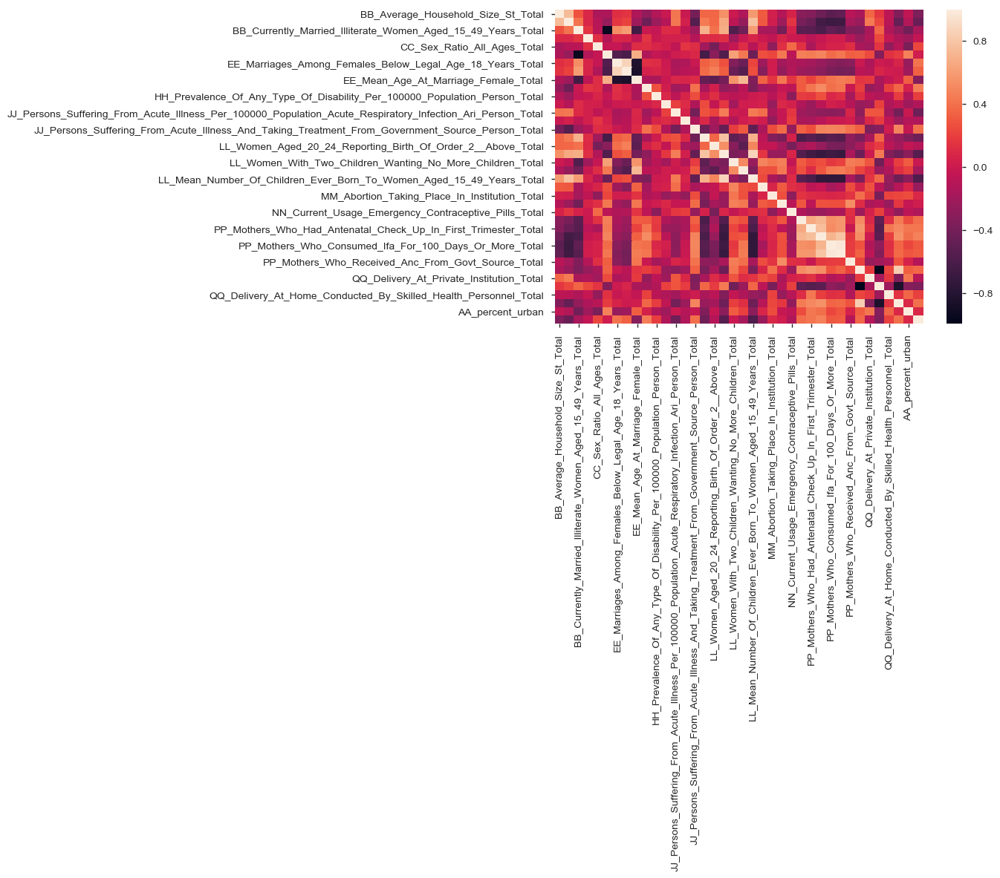

In [10]:
# visualize correlation matrix using a heatmap
ff=ff_data1.drop(['State_Name','State_District_Name','TT_Children_With_Birth_Weight_Less_Than_2_5_Kg_Total'],axis=1)
sns.heatmap(ff.corr())

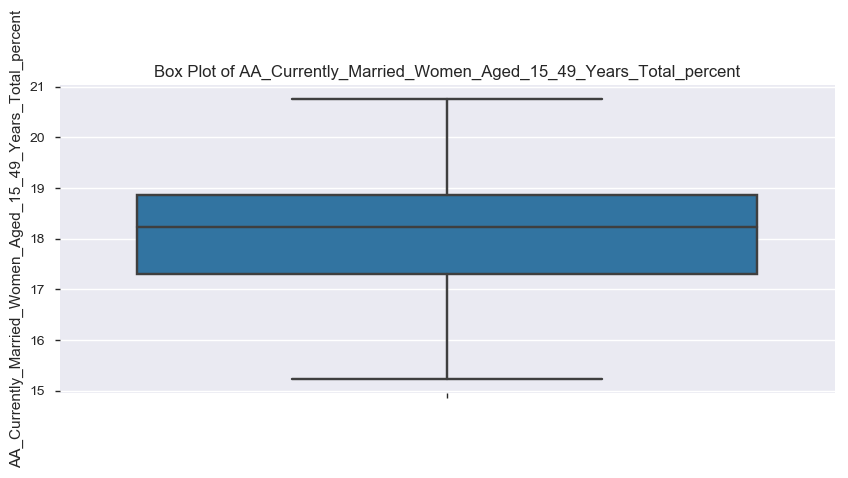

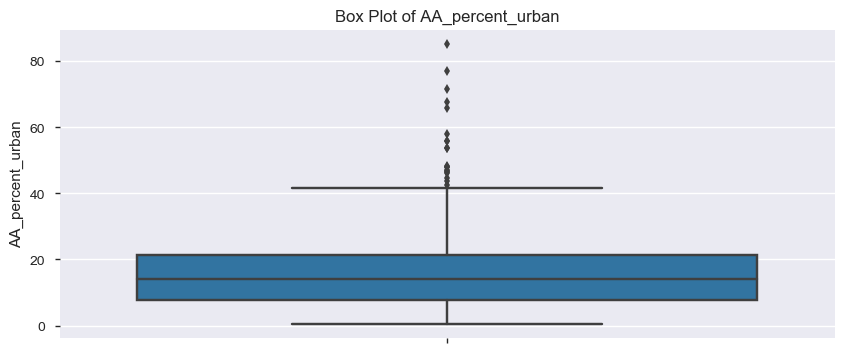

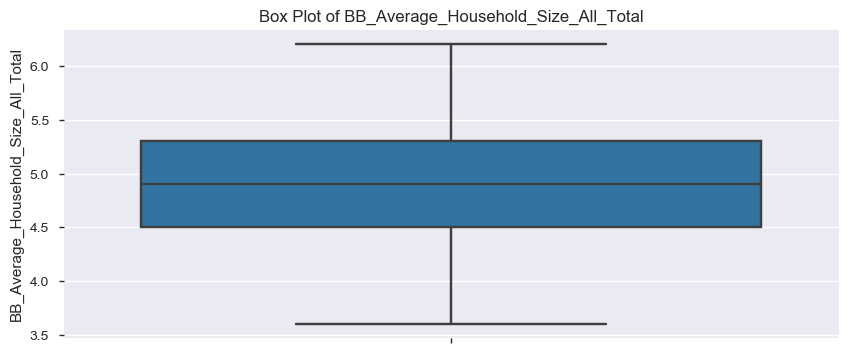

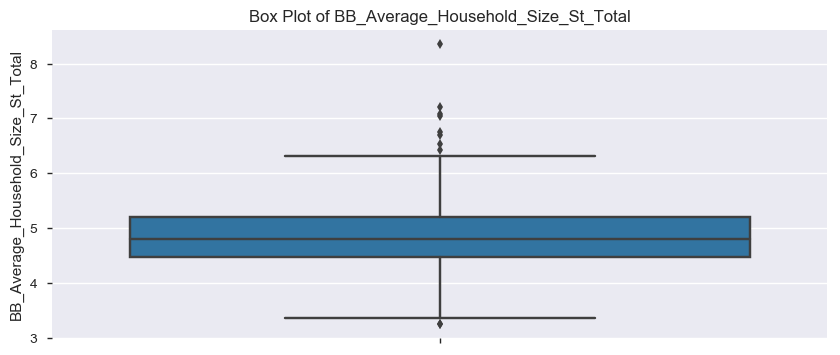

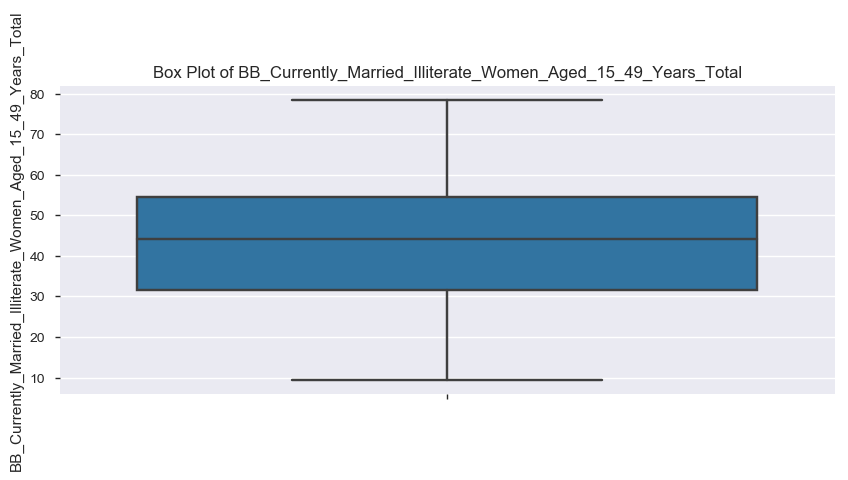

...

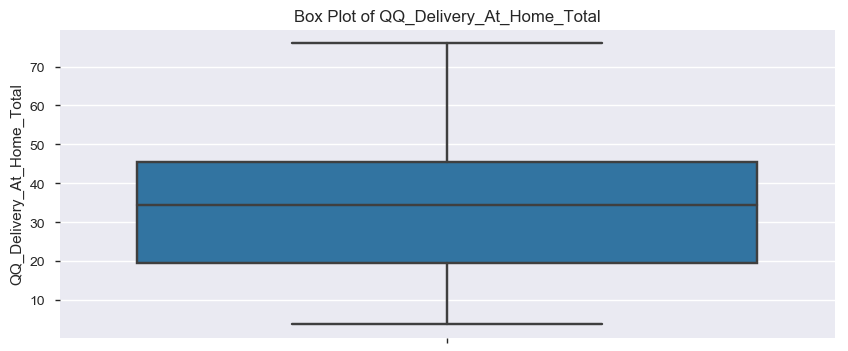

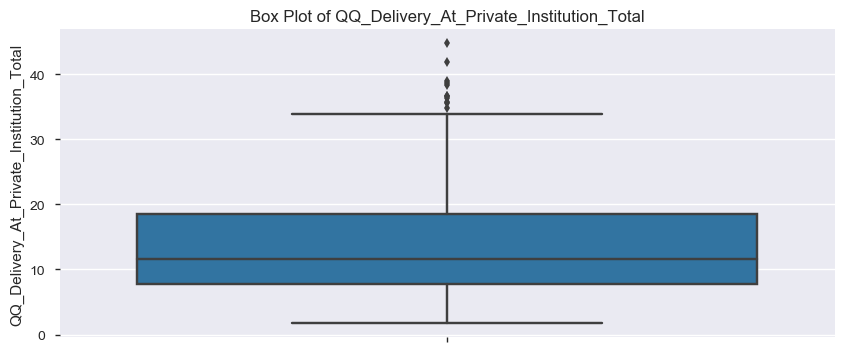

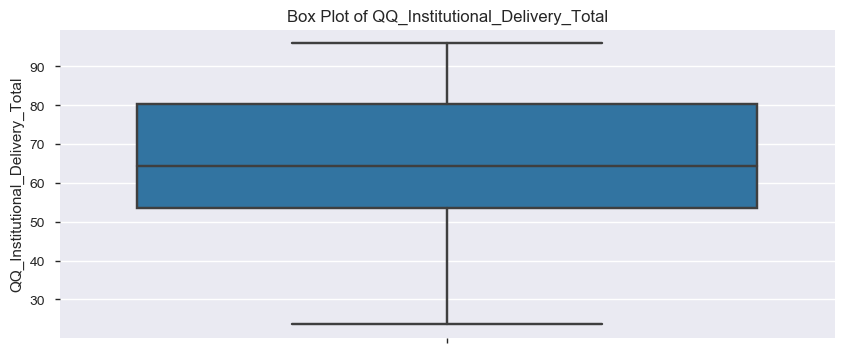

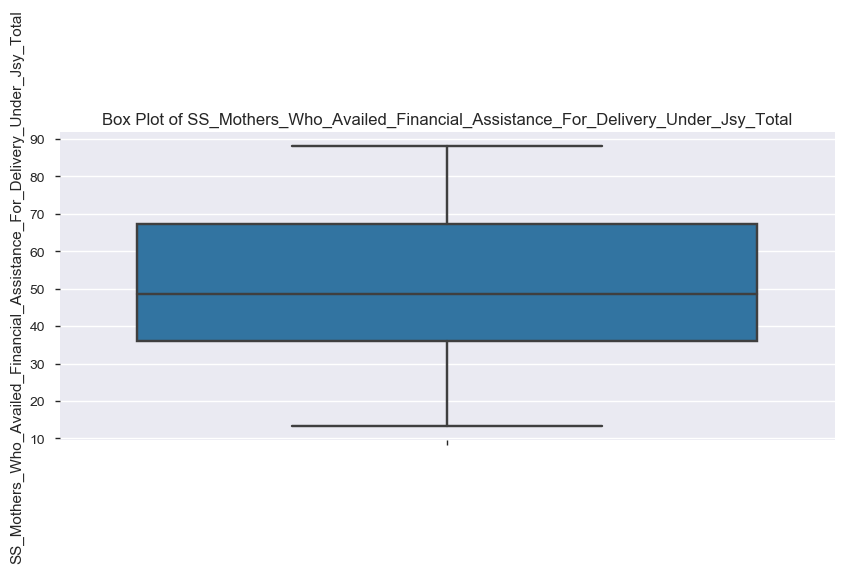

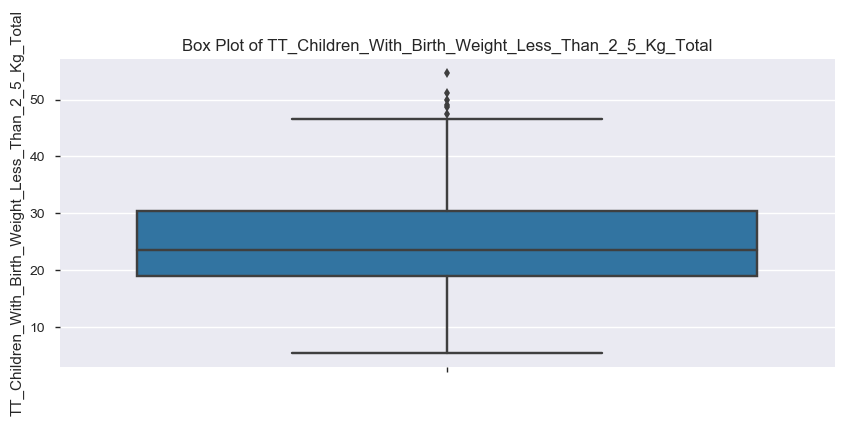

In [11]:
# BOXPLOT of each variable
for col in ff_data1.columns.difference(['State_Name','State_District_Name']):
    fig,axis=plt.subplots(figsize=(10,4))
    sns.boxplot(y=col,data=ff_data1)
    plt.title('Box Plot of '+col)
    plt.show()

<b> Standardize the Data</b>

In [13]:
standardized_data=StandardScaler().fit_transform(ff_data1._get_numeric_data())
sff_data=pd.DataFrame(standardized_data)
sff_data

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
0,-0.269172,-0.412995,-0.722295,0.188551,-0.163404,0.693526,-0.366058,-1.135812,0.609280,-0.787304,...,0.053680,1.767490,-0.720293,-0.765030,0.775699,-1.187847,-0.469360,-0.284797,-0.751570,0.288523
1,-0.269172,-0.236671,-0.653411,0.700219,-0.043547,0.829974,-0.176818,0.374207,0.609280,-0.706511,...,0.299829,1.922434,-0.575832,-0.970505,0.639495,0.045970,0.060632,-0.386166,-0.229780,0.378338
2,-1.132466,-0.589319,-1.454970,0.231190,0.555739,1.606676,-0.703987,-0.944401,1.478465,-0.302550,...,0.460360,-0.077762,0.002010,-0.422571,0.035459,0.119999,0.130227,0.312154,-0.394813,-0.926965
3,0.018593,-0.060347,0.054214,1.830153,-0.043547,0.189719,-0.082198,0.211154,0.995584,-0.331929,...,0.385445,1.847310,-0.102001,-0.993335,0.136131,-0.842378,0.199821,0.019310,-1.023660,-0.616382
4,1.169652,0.468624,-0.835015,1.510360,-0.058529,0.987413,0.025940,-0.575758,0.416127,-0.074862,...,-0.267383,1.898958,0.435392,-1.290133,-0.426452,-0.768349,1.377581,-1.185855,-0.329497,-0.090933
5,-0.125289,-0.412995,-0.615838,0.295148,-0.238315,0.735510,1.228967,1.338351,-0.839362,0.130791,...,-0.631255,1.978778,-1.292357,-1.244472,1.361970,-0.924633,-0.603197,-0.960590,-0.566146,0.493873
6,-0.556936,-0.765642,-0.947734,0.103273,0.151221,1.018901,-0.568816,-1.107455,1.478465,1.092954,...,1.691102,0.673486,0.949672,1.426707,-0.929815,0.177577,0.703046,0.740156,0.371339,0.424229
7,-0.269172,-0.236671,-0.922685,0.103273,-0.058529,1.270805,0.526075,1.309994,-0.259905,-0.794648,...,0.117893,2.138418,-0.529605,-1.096073,0.586198,0.144675,-0.019670,-0.746589,-0.678205,0.668226
8,0.450240,-0.765642,-0.897636,0.636261,0.196167,1.018901,-0.447161,-0.809705,1.285313,0.747751,...,0.524573,1.166492,0.475841,-0.068697,-0.456061,0.794485,0.686986,-0.037006,-0.427657,0.397438
9,-0.125289,0.115976,-1.317202,-2.028678,-0.088493,1.617172,-0.311989,-0.433972,0.512704,-0.721201,...,-0.138958,0.124136,-1.309692,-0.890598,1.391580,-0.809476,-0.608550,0.357207,-0.176018,-1.446243


# Outlier removal

We use Local Outlier Factor algorithm to detect and remove the outliers in the data.

In [14]:
m=lof().fit_predict(sff_data)
osff_data1=sff_data[m==1]

#Final outlier removed data
osff_data=pd.DataFrame(osff_data1)
osff_data.head()

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
0,-0.269172,-0.412995,-0.722295,0.188551,-0.163404,0.693526,-0.366058,-1.135812,0.609280,-0.787304,...,0.053680,1.767490,-0.720293,-0.765030,0.775699,-1.187847,-0.469360,-0.284797,-0.751570,0.288523
1,-0.269172,-0.236671,-0.653411,0.700219,-0.043547,0.829974,-0.176818,0.374207,0.609280,-0.706511,...,0.299829,1.922434,-0.575832,-0.970505,0.639495,0.045970,0.060632,-0.386166,-0.229780,0.378338
2,-1.132466,-0.589319,-1.454970,0.231190,0.555739,1.606676,-0.703987,-0.944401,1.478465,-0.302550,...,0.460360,-0.077762,0.002010,-0.422571,0.035459,0.119999,0.130227,0.312154,-0.394813,-0.926965
3,0.018593,-0.060347,0.054214,1.830153,-0.043547,0.189719,-0.082198,0.211154,0.995584,-0.331929,...,0.385445,1.847310,-0.102001,-0.993335,0.136131,-0.842378,0.199821,0.019310,-1.023660,-0.616382
4,1.169652,0.468624,-0.835015,1.510360,-0.058529,0.987413,0.025940,-0.575758,0.416127,-0.074862,...,-0.267383,1.898958,0.435392,-1.290133,-0.426452,-0.768349,1.377581,-1.185855,-0.329497,-0.090933


<b> CASE 1: Dependent variable is TT_Children_With_Birth_Weight_Less_Than_2_5_Kg_Total </b>

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


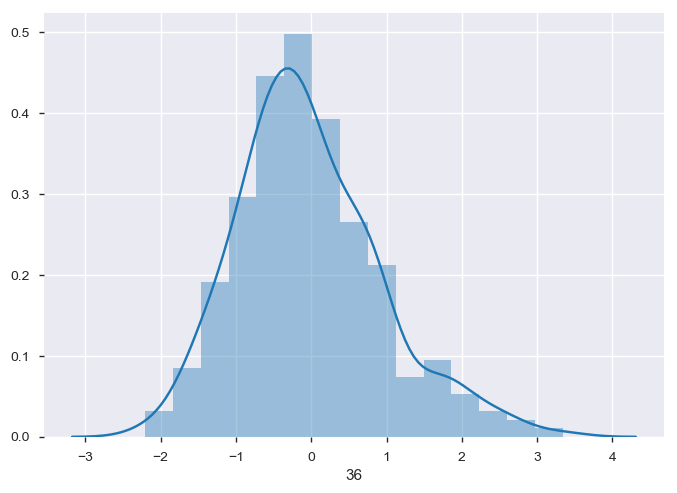

In [15]:
Y1=osff_data.loc[:,36]

#Histogram to check if dependent variable is normally distributed
sns.distplot(Y1)

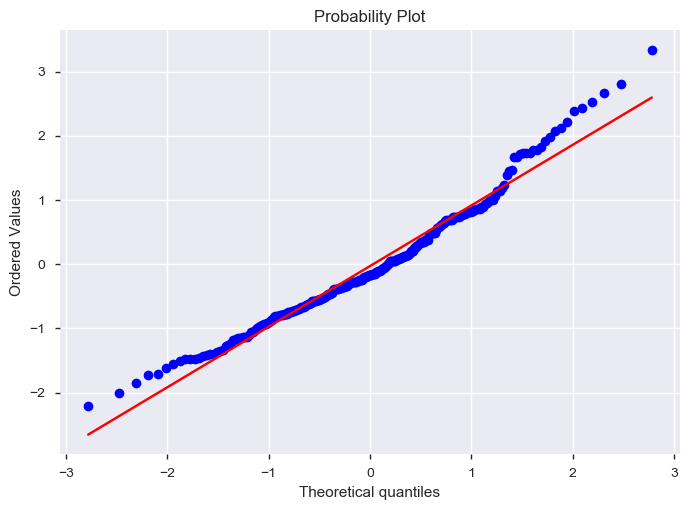

In [16]:
# Q-Q plot of dependent variable 
stats.probplot(Y1,dist='norm',plot=pylab)
pylab.show()

In [17]:
#Remove dependent variable from dataset
osff_data1=osff_data.drop(36,axis=1) 

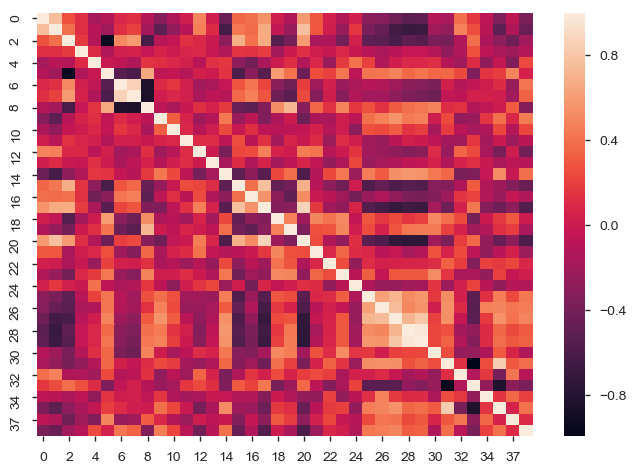

In [18]:
# visualize correlation matrix using a heatmap
sns.heatmap(osff_data1.corr())

# Clustering 

<b> 1. K-means  </b>

In [19]:
# calculate for k=1 through k=8
cluster_range = range(1,9)
cluster_errors = []

for num_clusters in cluster_range:
    clusters = KMeans( num_clusters )
    clusters.fit_transform(osff_data1)
    cluster_errors.append( clusters.inertia_ )
    
cluster_errors

[8953.339985173723,
 7036.933476514287,
 6237.329885469837,
 5715.137757803681,
 5314.9408037760695,
 4979.034341609703,
 4629.7261664332,
 4385.428641790652]

In [20]:
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )

clusters_df[0:9]

,num_clusters,cluster_errors
0,1,8953.339985
1,2,7036.933477
2,3,6237.329885
3,4,5715.137758
4,5,5314.940804
5,6,4979.034342
6,7,4629.726166
7,8,4385.428642


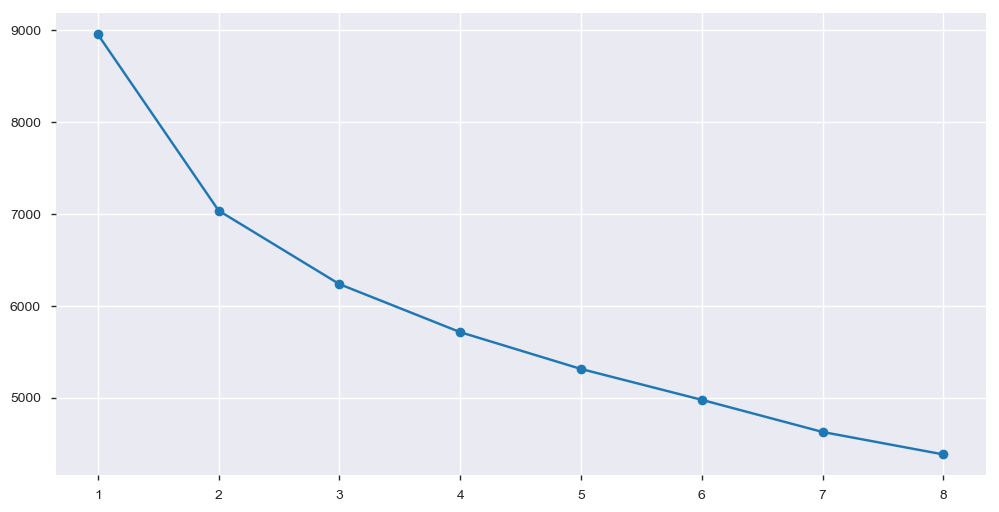

In [21]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )

<b> Silhoutee Coefficient </b>

In [22]:
#calculate SC for K=2 through K=8

k_range = range(2, 9)
scores = []
for k in k_range:
    km = KMeans(n_clusters=k, random_state=1)
    km.fit(osff_data1)
    scores.append(metrics.silhouette_score(osff_data1, km.labels_))

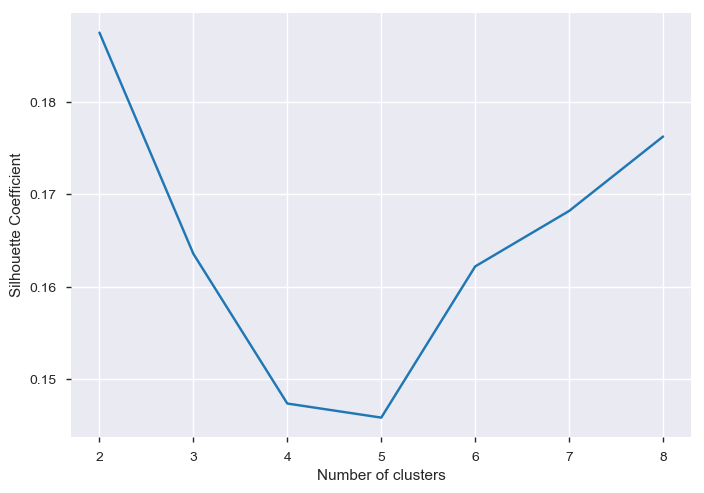

In [23]:
# plot the results
plt.plot(k_range, scores)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Coefficient')
plt.grid(True)

<b>Thus we observe that the optimal value of k is 2. Therefore we make two clusters.</b>

In [24]:
km_2=KMeans(n_clusters=2,random_state=123)
km_2.fit(osff_data1)
km_2.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

<b> 2. Hierarchical Clustering </b>

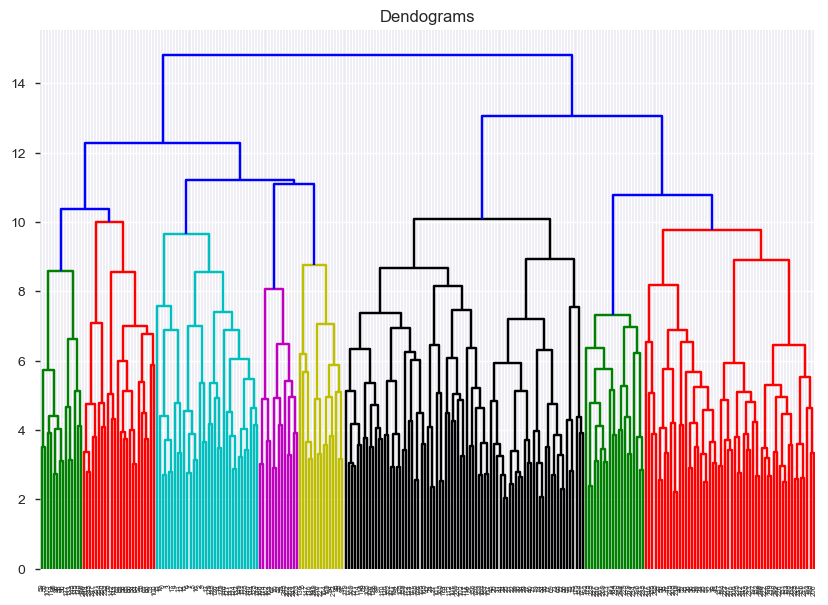

In [25]:
# 1.Complete linkage

plt.figure(figsize=(10, 7))
plt.title("Dendograms")
dend = shc.dendrogram(shc.linkage(osff_data1, method='complete'))

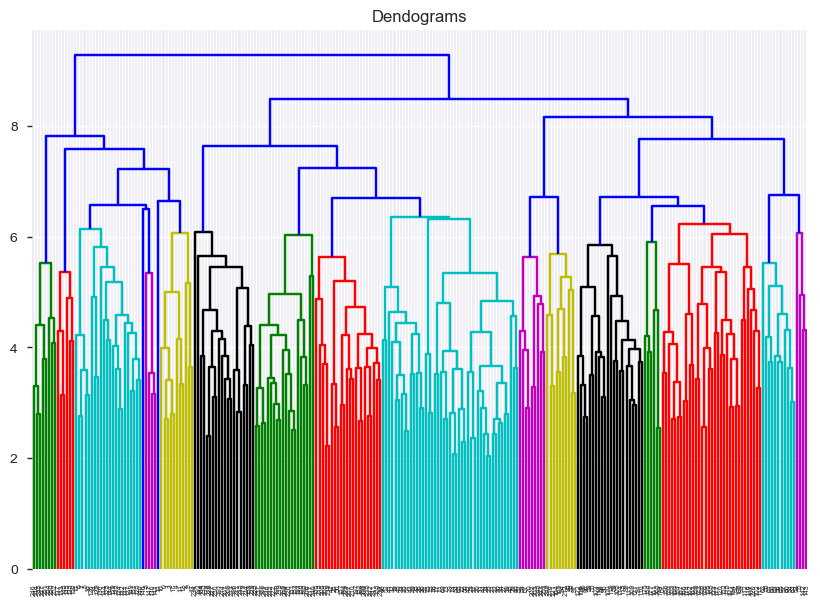

In [26]:
#Average linkage

plt.figure(figsize=(10, 7))
plt.title("Dendograms")
dend = shc.dendrogram(shc.linkage(osff_data1, method='average'))

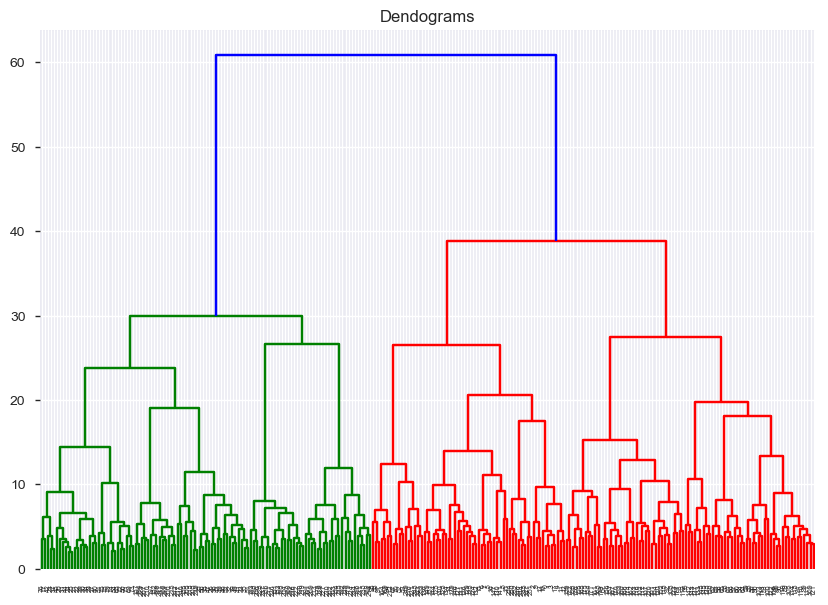

In [27]:
#3. Ward linkage
plt.figure(figsize=(10, 7))
plt.title("Dendograms")
dend = shc.dendrogram(shc.linkage(osff_data1, method='ward'))

# Creating Levels

<b> 2 levels : Low and High based on quartiles </b>

In [28]:
Y1.describe()

count    255.000000
mean      -0.029321
std        0.951377
min       -2.208555
25%       -0.668310
50%       -0.172165
75%        0.575713
max        3.341961
Name: 36, dtype: float64

In [29]:
def create_2_levels(y):
    l=[]
    for i in y:
        if i<=-0.172165:
            l.append("Low")
        else:
            l.append("High")
    Levels=pd.DataFrame({"Vulnerablity_Levels":l}) 
    return Levels


<b> 2 Levels based on mean

In [30]:
def create_2_levels_mean(y):
    l=[]
    for i in y:
        if i<=-0.029321:
            l.append("Low")
        else:
            l.append("High")
    Levels=pd.DataFrame({"Vulnerablity_Levels":l}) 
    return Levels

<b> 3 Levels : Low , Medium , High based on quartiles

In [31]:
def create_3_levels(y):
    l=[]
    for i in y:
        if i<= -0.668310:
            l.append("Low")
        elif -0.668310<i<0.575713:
            l.append("Medium")
        else:
            l.append("High")
    Levels=pd.DataFrame({"Vulnerablity_Levels":l}) 
    return Levels

<b> 4 Levels : Low , Medium , High , Very High based on quartiles

In [32]:
def create_4_levels(y):
    l=[]
    for i in y:
        if i<= -0.668310:
            l.append("Low")
        elif -0.668310<i<-0.172165:
            l.append("Medium")
        elif -0.172165<i<0.575713:
            l.append("High")
        else:
            l.append("Very High")
    Levels=pd.DataFrame({"Vulnerablity_Levels":l}) 
    return Levels

In [33]:
#Create 2 levels for dependent variable
create_2_levels(Y1).iloc[:,0].value_counts()

High    128
Low     127
Name: Vulnerablity_Levels, dtype: int64

In [34]:
# Create 2 levels based on mean
create_2_levels_mean(Y1).iloc[:,0].value_counts()

Low     143
High    112
Name: Vulnerablity_Levels, dtype: int64

In [35]:
#Create 3 levels for dependent variable
create_3_levels(Y1).iloc[:,0].value_counts()

Medium    127
Low        64
High       64
Name: Vulnerablity_Levels, dtype: int64

In [36]:
#Create 4 levels for dependent variables
create_4_levels(Y1).iloc[:,0].value_counts()

Low          64
High         64
Very High    64
Medium       63
Name: Vulnerablity_Levels, dtype: int64

# Splitting test and training data

In [37]:
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(osff_data1, Y1, test_size = 0.33, random_state = 123)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(170, 38)
(85, 38)
(170,)
(85,)


# Linear Regression

[ 0.41475298 -0.70318174 -1.03106551 -0.87015193  1.02251606  0.05170128
  0.14003494  0.55229795 -0.36032003 -0.7252879  -0.48202986  0.21655898
 -0.51548688 -0.39451494  0.42568366  1.68738199 -1.0993431   0.70578564
 -1.79047728 -0.91007785  0.17008439 -0.20272716  0.99532262  0.11686605
 -0.07790049 -0.11729168 -0.63246895  0.08431696 -0.24641776 -0.38426519
 -0.09713496 -0.17470529 -0.23007406  0.163785    0.20475302  1.03082491
  0.96239032 -1.64024698 -0.39768583  0.60745371 -0.51771826 -0.60420621
 -0.39046264  0.19123119 -0.4206173  -0.07212448 -0.12777544 -0.62608241
  2.20886175 -0.97064722  0.62881606 -0.31785364  1.0665227  -0.18335631
  0.47442145  0.16497543  1.03619599  0.2423695  -0.12539126  0.82114074
 -1.21796394 -0.47406577 -0.28442696  0.79722227 -0.2817111   0.01028388
 -0.24019708  0.8993089  -2.10895425 -0.17963885 -0.73023078  0.34094914
 -0.30707146  0.54597534 -0.3456811   0.49593864  1.25270289  0.03120401
 -0.39437021  0.04687206 -0.40811678  0.57418723 -0

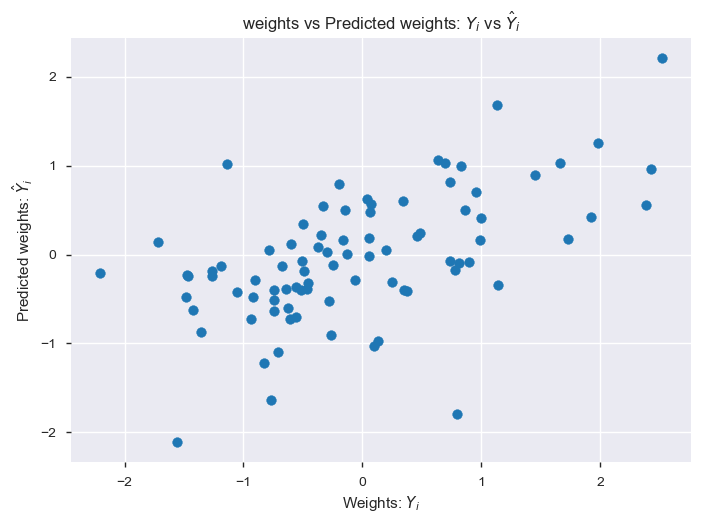

In [38]:
# Apply Linear regression
lm = LinearRegression()
lm.fit(X_train, Y_train)

#Prediction
Y_pred = lm.predict(X_test)
print(Y_pred)

# Scatter plot Y_test vs Y_predicted
plt.scatter(Y_test, Y_pred)
plt.xlabel("Weights: $Y_i$")
plt.ylabel("Predicted weights: $\hat{Y}_i$")
plt.title("weights vs Predicted weights: $Y_i$ vs $\hat{Y}_i$")
plt.show()

<b> Distribustion of Error in the regression model </b>

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


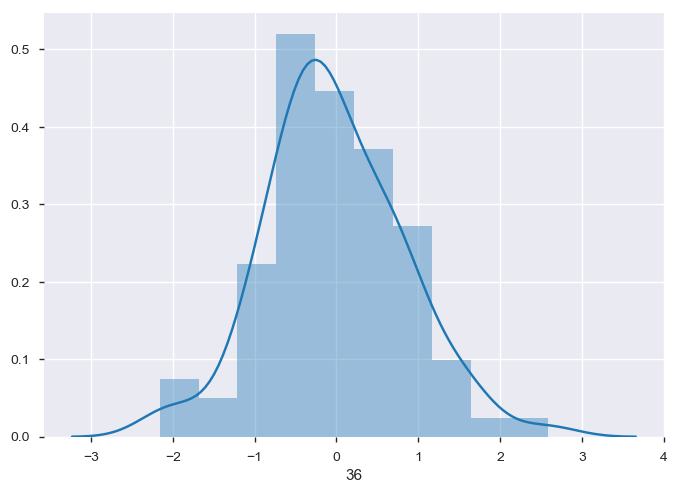

In [39]:
delta_y = Y_test - Y_pred
sns.distplot(delta_y)

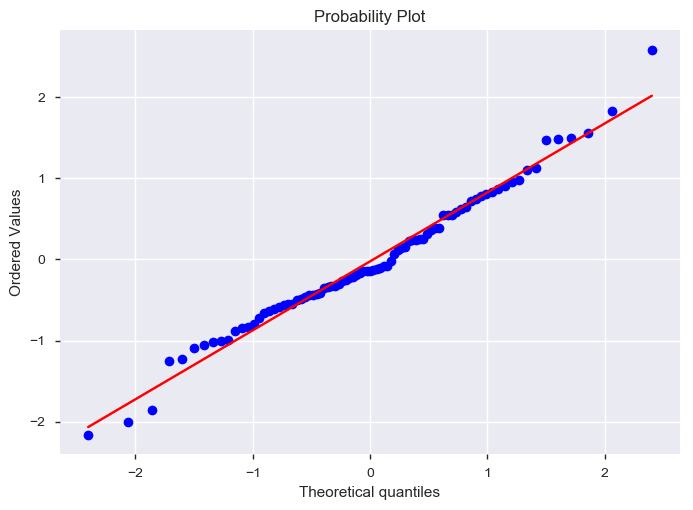

In [40]:
# Q-Q plot of error
stats.probplot(delta_y,dist='norm',plot=pylab)
pylab.show()

In [41]:
#OLS regression results

train_X = sm.add_constant(X_train)
lm=sm.OLS(Y_train,train_X).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     36   R-squared:                       0.557
Model:                            OLS   Adj. R-squared:                  0.429
Method:                 Least Squares   F-statistic:                     4.337
Date:                Fri, 10 Jul 2020   Prob (F-statistic):           1.93e-10
Time:                        12:28:18   Log-Likelihood:                -158.47
No. Observations:                 170   AIC:                             394.9
Df Residuals:                     131   BIC:                             517.2
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0322      0.058     -0.554      0.580      -0.147       0.083
0              0.1174      0.099      1.183      0.239      -0.079       0.314
1             -0.1348      0.151     -0.891      0.374      -0.434       0.164
2             -0.0830      0.350     -0.237      0.813      -0.775       0.609
3             -0.0428      0.064     -0.666      0.506      -0.170       0.084
4             -0.1095      0.107     -1.020      0.309      -0.322       0.103
5             -0.2848      0.360     -0.791      0.430      -0.997       0.427
6              0.0087      0.183      0.047      0.962      -0.354       0.371
7              0.3672      0.163      2.255      0.026       0.045       0.689
8              0.1658      0.224      0.742      0.460      -0.276       0.608
9              0.0992      0.097      1.024      0.308      -0.092       0.291
10             0.0926      0.085      1.084      0.280      -0.076       0.262
11            -0.0419      0.093     -0.451      0.653      -0.225       0.142
12             0.1739      0.088      1.987      0.049       0.001       0.347
13             0.1638      0.098      1.680      0.095      -0.029       0.357
14             0.2592      0.119      2.174      0.032       0.023       0.495
15             0.0475      0.149      0.320      0.750      -0.247       0.342
16            -0.0798      0.138     -0.578      0.565      -0.353       0.193
17            -0.0659      0.198     -0.333      0.740      -0.457       0.325
18             0.4865      0.110      4.416      0.000       0.269       0.705
19            -0.1895      0.132     -1.437      0.153      -0.450       0.071
20             0.2737      0.214      1.279      0.203      -0.149       0.697
21            -0.1050      0.088     -1.187      0.237      -0.280       0.070
22             0.0055      0.092      0.059      0.953      -0.177       0.188
23            -0.0900      0.110     -0.821      0.413      -0.307       0.127
24            -0.0830      0.107     -0.778      0.438      -0.294       0.128
25            -0.0513      0.121     -0.424      0.672      -0.290       0.188
26            -0.0045      0.149     -0.030      0.976      -0.299       0.290
27             0.6892      0.174      3.972      0.000       0.346       1.032
28             0.3021      0.342      0.883      0.379      -0.375       0.979
29            -0.7712      0.384     -2.009      0.047      -1.531      -0.012
30            -0.1693      0.114     -1.481      0.141      -0.396       0.057
31            -1.6802      0.843     -1.992      0.048      -3.349      -0.012
32             0.1071      0.182      0.589      0.557      -0.252       0.467
33            -1.5354      0.823     -1.865      0.064      -3.164       0.093
34            -0.1869      0.087     -2.138      0.034      -0.360      -0.014
35

<b> Selecting variables based on 90% level of significance </b>
<p> y = b_0 + b_1*x_1 + b_2*x_2+ ... + b_39*x_38 </p>
<p>  <b>Hypothesis :- </b><p> H_0: b_i = 0 </p> H_1: b_i =/= 0 where i is 0 to 39 </p>

In [42]:
# rejecting all those variables which are failing to reject the null hypothesis
n_osff_data=osff_data1.loc[:,[7,12,13,14,18,19,27,29,30,33,34,37,38]]


<b> Splitting test and training data </b>

In [43]:
x_train, x_test, y_train, y_test = model_selection.train_test_split(n_osff_data, Y1, test_size = 0.33, random_state = 123)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(170, 13)
(85, 13)
(170,)
(85,)


[ 0.11434536 -0.34659096 -0.64434267 -0.54942581  0.66219644 -0.25923783
  0.15993448  0.13863817 -0.0134875  -0.11041557 -0.04122779 -0.06548878
 -0.3475796   0.07277267  0.12668864  1.63509303 -0.86804482  0.75619156
 -1.57996922 -0.99435314  0.21141347  0.31922855  0.14849058 -0.3223466
  0.14391874  0.03841515 -0.26416441  0.06561917  0.00311838 -0.31121956
  0.06812816 -0.52372474  0.0290664  -0.03163228 -0.03676887  0.74424987
  0.21978883 -1.34425563 -0.22841534  0.57563205 -0.27482375 -0.03608396
 -0.11490621  0.02381384 -0.51237483 -0.19025237  0.23493775 -0.88554202
  1.92770471 -0.84360556  0.82760012 -0.08152227  1.17789908 -0.19707011
  0.57119709 -0.04228984  1.39209599  0.14409458 -0.15213486  0.74588963
 -0.80955266 -0.09808046 -0.29159725  0.68047026  0.0683623  -0.05909603
  0.28038561  0.6721872  -2.03943673 -0.43556766 -0.58228381 -0.13025098
 -0.8474189   0.53768359 -0.78553791  0.03168593  0.58715583  0.15089355
  0.04142679  0.01385552 -0.06766045  0.81770458  0.

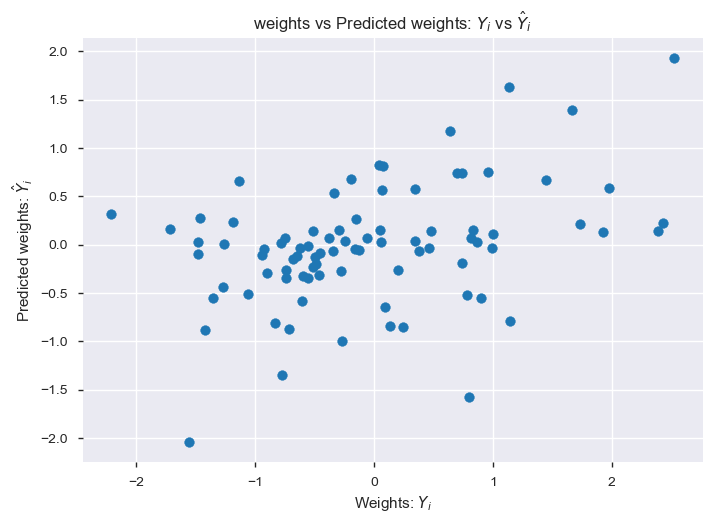

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


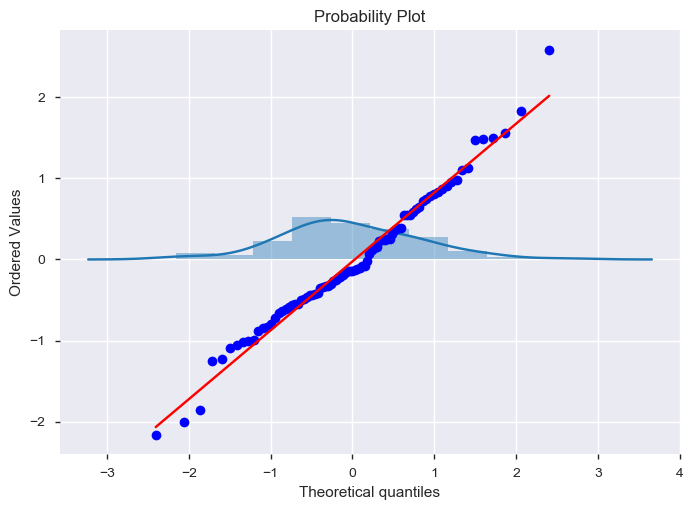

In [45]:
lm = LinearRegression()
lm.fit(x_train, y_train)

y_pred = lm.predict(x_test)
print(y_pred)

plt.scatter(y_test, y_pred)
plt.xlabel("Weights: $Y_i$")
plt.ylabel("Predicted weights: $\hat{Y}_i$")
plt.title("weights vs Predicted weights: $Y_i$ vs $\hat{Y}_i$")
plt.show()
# Distplot of Error
delta_y = Y_test - Y_pred
sns.distplot(delta_y)
# Q-Q plot of error
stats.probplot(delta_y,dist='norm',plot=pylab)
pylab.show()

In [46]:
train_x = sm.add_constant(x_train)
lm=sm.OLS(y_train,train_x).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     36   R-squared:                       0.474
Model:                            OLS   Adj. R-squared:                  0.430
Method:                 Least Squares   F-statistic:                     10.80
Date:                Fri, 10 Jul 2020   Prob (F-statistic):           3.59e-16
Time:                        12:34:04   Log-Likelihood:                -173.16
No. Observations:                 170   AIC:                             374.3
Df Residuals:                     156   BIC:                             418.2
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0424      0.054     -0.780      0.437      -0.150       0.065
7              0.4261      0.084      5.089      0.000       0.261       0.591
12             0.1559      0.066      2.348      0.020       0.025       0.287
13             0.1803      0.080      2.267      0.025       0.023       0.337
14             0.3621      0.099      3.669      0.000       0.167       0.557
18             0.3366      0.078      4.290      0.000       0.182       0.492
19            -0.2596      0.082     -3.184      0.002      -0.421      -0.099
27             0.5461      0.117      4.672      0.000       0.315       0.777
29            -0.3846      0.111     -3.476      0.001      -0.603      -0.166
30            -0.2789      0.080     -3.486      0.001      -0.437      -0.121
33            -0.1496      0.077     -1.944      0.054      -0.302       0.002
34            -0.1717      0.063     -2.714      0.007      -0.297      -0.047
37             0.1452      0.065      2.249      0.026       0.018       0.273
38            -0.5125      0.083     -6.145      0.000      -0.677      -0.348
==============================================================================
Omnibus:                       10.456   Durbin-Watson:                   2.066
Prob(Omnibus):                  0.005   Jarque-Bera (JB):               10.577
Skew:                           0.564   Prob(JB):                      0.00505
Kurtosis:                       3.471   Cond. No.                         5.61
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<b> Classification using Linear Regression ( 2 Levels) </b>

<b> 1. MODEL 1 </b>

In [47]:
Y_test_Levels=create_2_levels(Y_test)
Y_pred_Levels=create_2_levels(Y_pred)
print("Accuracy:",metrics.accuracy_score(Y_test_Levels, Y_pred_Levels))

Accuracy: 0.7294117647058823


[[30 14]
 [ 9 32]]


Text(0.5,28.3611,'Predicted label')

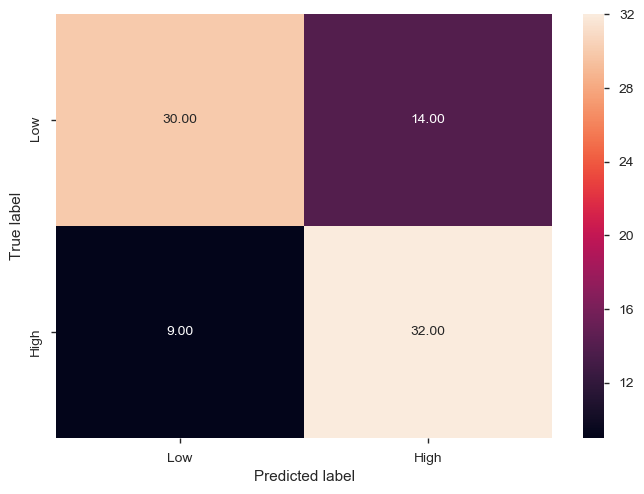

In [48]:
#Confusion matrix
cmm= metrics.confusion_matrix( Y_test_Levels,Y_pred_Levels, ["Low","High"] )
print(cmm)
sns.heatmap(cmm, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

<b> 2. MODEL 2 </b>

In [49]:
y_test_Levels=create_2_levels(y_test)
y_pred_Levels=create_2_levels(y_pred)
print("Accuracy:",metrics.accuracy_score(y_test_Levels, y_pred_Levels))

Accuracy: 0.6


[[19 25]
 [ 9 32]]


Text(0.5,28.3611,'Predicted label')

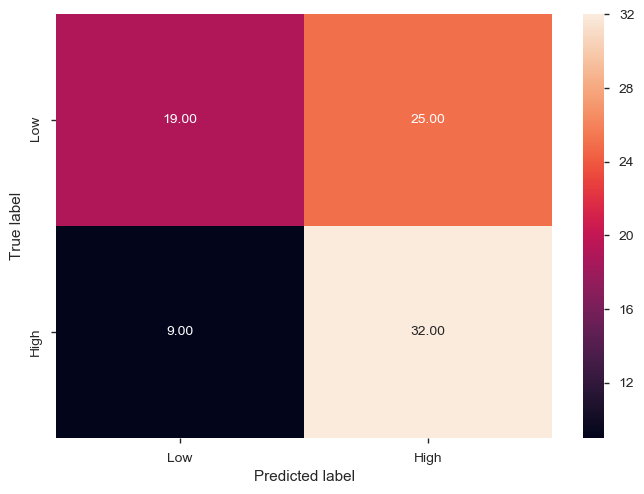

In [50]:
#Confusion matrix
cmmm= metrics.confusion_matrix( y_test_Levels,y_pred_Levels, ["Low","High"] )
print(cmmm)
sns.heatmap(cmmm, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

<b> Classification using Linear Regression ( 3 Levels) </b>

<b> 1. MODEL 1 </b>

In [51]:
Y_test_3Levels=create_3_levels(Y_test)
Y_pred_3Levels=create_3_levels(Y_pred)
print("Accuracy:",metrics.accuracy_score(Y_test_3Levels, Y_pred_3Levels))

Accuracy: 0.5529411764705883


<b> 2. MODEL 2 </b>

In [52]:
y_test_3Levels=create_3_levels(y_test)
y_pred_3Levels=create_3_levels(y_pred)
print("Accuracy:",metrics.accuracy_score(y_test_3Levels, y_pred_3Levels))

Accuracy: 0.5411764705882353


<b> Classification using Linear Regression ( 4 Levels) </b>

<b> 1. MODEL 1 </b>

In [53]:
Y_test_4Levels=create_4_levels(Y_test)
Y_pred_4Levels=create_4_levels(Y_pred)
print("Accuracy:",metrics.accuracy_score(Y_test_4Levels, Y_pred_4Levels))

Accuracy: 0.4117647058823529


<b> 2. MODEL 2 </b>

In [54]:
y_test_4Levels=create_4_levels(y_test)
y_pred_4Levels=create_4_levels(y_pred)
print("Accuracy:",metrics.accuracy_score(y_test_4Levels, y_pred_4Levels))

Accuracy: 0.38823529411764707


<b> Classification using Linear Regression ( 2 Levels based on mean) </b>

<b> 1. MODEL 1 </b>

In [55]:
Y_test_2Levels=create_2_levels_mean(Y_test)
Y_pred_2Levels=create_2_levels_mean(Y_pred)
print("Accuracy:",metrics.accuracy_score(Y_test_2Levels, Y_pred_2Levels))

Accuracy: 0.7176470588235294


<b> 2. MODEL 2 </b>

In [56]:
y_test_2Levels=create_2_levels_mean(y_test)
y_pred_2Levels=create_2_levels_mean(y_pred)
print("Accuracy:",metrics.accuracy_score(y_test_2Levels, y_pred_2Levels))

Accuracy: 0.6470588235294118


# K- Nearest Neighbour (KNN)

<b> 2 Levels </b>

In [57]:
Y_train_Levels=create_2_levels(Y_train)
X_tr,X_cv,y_tr,y_cv=model_selection.train_test_split(X_train,Y_train_Levels,test_size=0.3,random_state=1234)

In [58]:
# now i have to determine the the valid k for which i have to fit training set(x_train) then predict the cross validation set(x_cv)
# from there deterimine which k gives down the best accuracy.
for i in range(1,50,2):
   
    # instantiate learning model (k=30)
    knn=KNeighborsClassifier(n_neighbors=i)
    # fitting the model in cross-validation train
    knn.fit(X_tr,y_tr)
    #predict the response of cross validation train
    predd=knn.predict(X_cv)
    
    # evaluate CV accuracy
    acc=accuracy_score(y_cv,predd,normalize=True)*float(100)
    print("Test accuracy for k","=", i," is ",acc)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A

Test accuracy for k = 1  is  68.62745098039215
Test accuracy for k = 3  is  68.62745098039215
Test accuracy for k = 5  is  70.58823529411765
Test accuracy for k = 7  is  70.58823529411765
Test accuracy for k = 9  is  66.66666666666666
Test accuracy for k = 11  is  62.745098039215684
Test accuracy for k = 13  is  64.70588235294117
Test accuracy for k = 15  is  66.66666666666666
Test accuracy for k = 17  is  68.62745098039215
Test accuracy for k = 19  is  66.66666666666666
Test accuracy for k = 21  is  66.66666666666666
Test accuracy for k = 23  is  62.745098039215684
Test accuracy for k = 25  is  60.78431372549019
Test accuracy for k = 27  is  62.745098039215684
Test accuracy for k = 29  is  64.70588235294117
Test accuracy for k = 31  is  64.70588235294117
Test accuracy for k = 33  is  60.78431372549019
Test accuracy for k = 35  is  58.82352941176471
Test accuracy for k = 37  is  60.78431372549019
Test accuracy for k = 39  is  62.745098039215684
Test accuracy for k = 41  is  64.70588235

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A

In [59]:
# Now from above we could able to determine that for k=1 we are getting maximum accuracy in cross validation dataset
# Now we apply it on the test dataset
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train,Y_train_Levels)
pred=knn.predict(X_test)
acc=accuracy_score(Y_test_Levels,pred,normalize=True)*float(100)
print('Test accuracy for k=5',"is",acc)

Test accuracy for k=5 is 80.0


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  after removing the cwd from sys.path.


[[37  7]
 [10 31]]


Text(0.5,28.3611,'Predicted label')

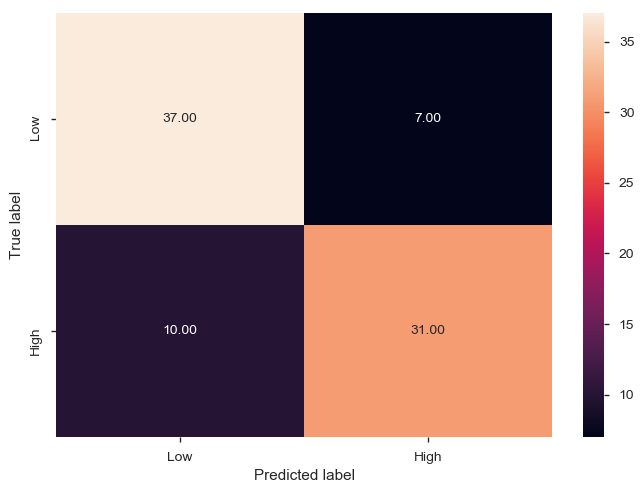

In [60]:
#Confusion matrix
ccm= metrics.confusion_matrix( Y_test_Levels,pred, ["Low","High"] )
print(ccm)
sns.heatmap(ccm, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

<b> 2 Levels based on mean</b>

In [61]:
Y_train_2Levels=create_2_levels_mean(Y_train)
X_tr,X_cv,y_tr,y_cv=model_selection.train_test_split(X_train,Y_train_2Levels,test_size=0.3,random_state=1234)

In [62]:
# now i have to determine the the valid k for which i have to fit training set(x_train) then predict the cross validation set(x_cv)
# from there deterimine which k gives down the best accuracy.
for i in range(1,50,2):
   
    # instantiate learning model (k=30)
    knn1=KNeighborsClassifier(n_neighbors=i)
    # fitting the model in cross-validation train
    knn1.fit(X_tr,y_tr)
    #predict the response of cross validation train
    preddd=knn1.predict(X_cv)
    
    # evaluate CV accuracy
    acc=accuracy_score(y_cv,preddd,normalize=True)*float(100)
    print("Test accuracy for k","=", i," is ",acc)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A

Test accuracy for k = 1  is  80.3921568627451
Test accuracy for k = 3  is  72.54901960784314
Test accuracy for k = 5  is  78.43137254901961
Test accuracy for k = 7  is  74.50980392156863
Test accuracy for k = 9  is  80.3921568627451
Test accuracy for k = 11  is  76.47058823529412
Test accuracy for k = 13  is  70.58823529411765
Test accuracy for k = 15  is  72.54901960784314
Test accuracy for k = 17  is  70.58823529411765
Test accuracy for k = 19  is  70.58823529411765
Test accuracy for k = 21  is  72.54901960784314
Test accuracy for k = 23  is  70.58823529411765
Test accuracy for k = 25  is  72.54901960784314
Test accuracy for k = 27  is  70.58823529411765
Test accuracy for k = 29  is  64.70588235294117
Test accuracy for k = 31  is  70.58823529411765
Test accuracy for k = 33  is  70.58823529411765
Test accuracy for k = 35  is  70.58823529411765
Test accuracy for k = 37  is  68.62745098039215
Test accuracy for k = 39  is  70.58823529411765
Test accuracy for k = 41  is  64.70588235294117

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: A

In [63]:
# Now from above we could able to determine that for k=1 we are getting maximum accuracy in cross validation dataset
# Now we apply it on the test dataset
knn1=KNeighborsClassifier(n_neighbors=9)
knn1.fit(X_train,Y_train_2Levels)
pred0=knn1.predict(X_test)
acc=accuracy_score(Y_test_2Levels,pred,normalize=True)*float(100)
print('Test accuracy for k=9',"is",acc)

Test accuracy for k=9 is 77.64705882352942


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  after removing the cwd from sys.path.


# Decision Tree

<b> 2 Levels </b>

In [64]:
param_grid={'max_depth':np.arange(3,10),
                             'max_features':np.arange(1,10),
                             'min_samples_split':np.arange(2,15),
                             'min_samples_leaf':np.arange(1,6)}
tree=GridSearchCV(DecisionTreeClassifier(),param_grid,cv=5)
tree.fit(X_train,Y_train_Levels.values.ravel())

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': array([3, 4, 5, 6, 7, 8, 9]), 'max_features': array([1, 2, 3, 4, 5, 6, 7, 8, 9]), 'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]), 'min_samples_leaf': array([1, 2, 3, 4, 5])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [65]:
tree.best_params_

{'max_depth': 6,
 'max_features': 4,
 'min_samples_leaf': 3,
 'min_samples_split': 11}

In [66]:
print(accuracy_score(Y_test_Levels, tree.best_estimator_.predict(X_test)))

0.6705882352941176


[[29 15]
 [13 28]]


Text(0.5,28.3611,'Predicted label')

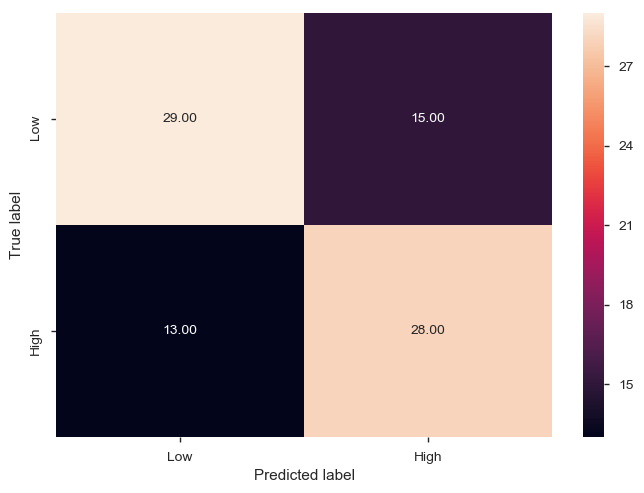

In [68]:
# Confusion matrix for 2 levels

cm= metrics.confusion_matrix( Y_test_Levels,tree.best_estimator_.predict(X_test), ["Low","High"] )
print(cm)
sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

<b> 2 Levels based on mean </b>

In [69]:
param_grid={'max_depth':np.arange(3,10),
                             'max_features':np.arange(1,10),
                             'min_samples_split':np.arange(2,15),
                             'min_samples_leaf':np.arange(1,6)}
tree=GridSearchCV(DecisionTreeClassifier(),param_grid,cv=5)
tree.fit(X_train,Y_train_2Levels.values.ravel())

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': array([3, 4, 5, 6, 7, 8, 9]), 'max_features': array([1, 2, 3, 4, 5, 6, 7, 8, 9]), 'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]), 'min_samples_leaf': array([1, 2, 3, 4, 5])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [72]:
tree.best_params_

{'max_depth': 6,
 'max_features': 3,
 'min_samples_leaf': 5,
 'min_samples_split': 7}

In [73]:
print(accuracy_score(Y_test_2Levels, tree.best_estimator_.predict(X_test)))

0.49411764705882355


# Random Forest

<b> 2 Levels </b>

In [70]:
param_grid1={'max_depth':np.arange(3,10),'n_estimators':[50,100,200,400,600,800,900]}
tree1=GridSearchCV(RandomForestClassifier(),param_grid1,cv=5)
tree1.fit(X_train,Y_train_Levels.values.ravel())

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': array([3, 4, 5, 6, 7, 8, 9]), 'n_estimators': [50, 100, 200, 400, 600, 800, 900]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [74]:
tree1.best_params_

{'max_depth': 6, 'n_estimators': 50}

In [75]:
print(accuracy_score(Y_test_Levels, tree1.best_estimator_.predict(X_test)))

0.7058823529411765


[[29 15]
 [10 31]]


Text(0.5,28.3611,'Predicted label')

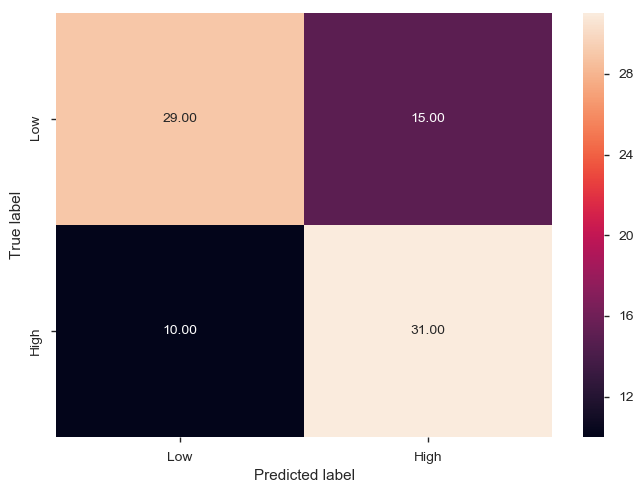

In [76]:
# Confusion matrix for 2 levels

cm1= metrics.confusion_matrix( Y_test_Levels,tree1.best_estimator_.predict(X_test), ["Low","High"] )
print(cm1)
sns.heatmap(cm1, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

<b> 2 Levels based on mean </b>

In [77]:
param_grid1={'max_depth':np.arange(3,10),'n_estimators':[50,100,200,400,600,800,900]}
tree1=GridSearchCV(RandomForestClassifier(),param_grid1,cv=5)
tree1.fit(X_train,Y_train_2Levels.values.ravel())

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': array([3, 4, 5, 6, 7, 8, 9]), 'n_estimators': [50, 100, 200, 400, 600, 800, 900]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [78]:
print(accuracy_score(Y_test_2Levels, tree1.best_estimator_.predict(X_test)))

0.6235294117647059


# Logistic Regression

In [79]:
logreg=LogisticRegression(C=10**(-4),penalty='l2')
logreg.fit(X_train,Y_train_Levels)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression(C=0.0001, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False)

In [80]:
X_pred=logreg.predict(X_test)
print(accuracy_score(Y_test_Levels, X_pred))

0.6588235294117647


[[27 17]
 [12 29]]


Text(0.5,28.3611,'Predicted label')

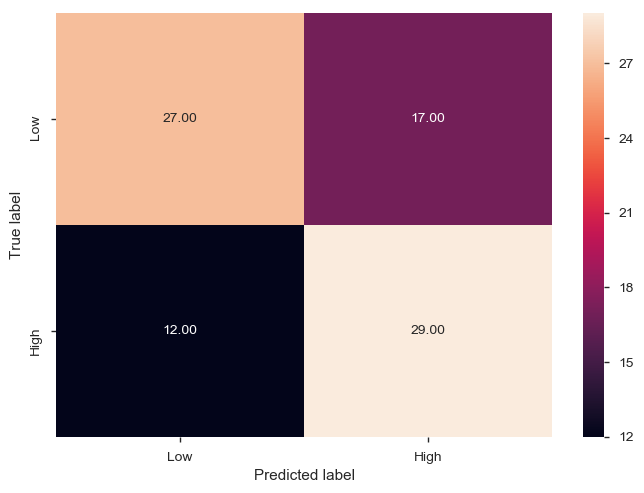

In [81]:
# Confusion matrix for 2 levels

cm2= metrics.confusion_matrix(Y_test_Levels, X_pred, ["Low","High"] )
print(cm2)
sns.heatmap(cm2, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [82]:
logreg1=LogisticRegression(C=10**(-4),penalty='l2')
logreg1.fit(X_train,Y_train_2Levels)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression(C=0.0001, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False)

In [83]:
X_pred1=logreg1.predict(X_test)
print(accuracy_score(Y_test_2Levels, X_pred1))

0.611764705882353


# AdaBoosting

In [84]:
rdf=RandomForestClassifier(max_depth= 7, n_estimators= 800)
dt= DecisionTreeClassifier(max_depth= 7,max_features= 9,min_samples_leaf= 5,min_samples_split= 11)

<b> Using Random forest

In [85]:
abc = AdaBoostClassifier(base_estimator= rdf ,n_estimators=600,
                         learning_rate=10**(-3))

<b> 2 Levels

In [86]:
model = abc.fit(X_train, Y_train_Levels)
Y_predR= model.predict(X_test)
print("Accuracy:",metrics.accuracy_score(Y_test_Levels, Y_predR))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.7176470588235294


[[26 18]
 [10 31]]


Text(0.5, 15.0, 'Predicted label')

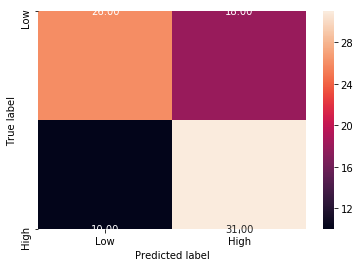

In [81]:
# Confusion matrix for 2 levels

cm3= metrics.confusion_matrix(Y_test_Levels, Y_predR, ["Low","High"] )
print(cm3)
sns.heatmap(cm3, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

<b> 2 Levels based on mean

In [87]:
model1 = abc.fit(X_train, Y_train_2Levels)
Y_predR1= model1.predict(X_test)
print("Accuracy:",metrics.accuracy_score(Y_test_2Levels, Y_predR1))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.6705882352941176


<b> Using Decision Tree

In [88]:
abc1 = AdaBoostClassifier(base_estimator= dt ,n_estimators=600,
                         learning_rate=10**(-3))

<b> 2 Levels

In [89]:
model2=abc1.fit(X_train, Y_train_Levels)
Y_predR2= model2.predict(X_test)
print("Accuracy:",metrics.accuracy_score(Y_test_Levels, Y_predR2))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.7058823529411765


[[27 17]
 [ 8 33]]


Text(0.5,28.3611,'Predicted label')

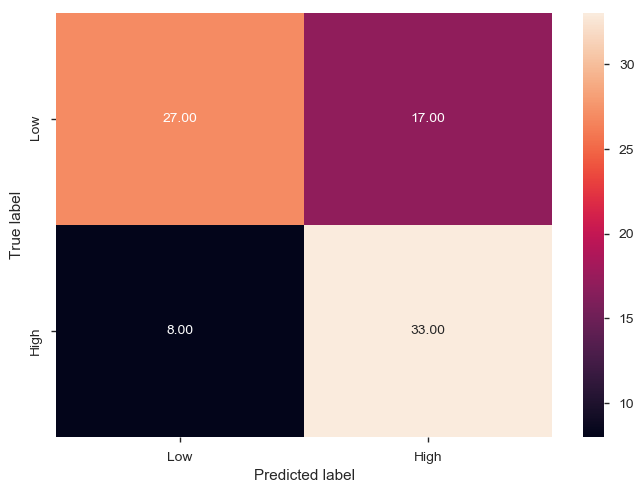

In [90]:
# Confusion matrix for 2 levels

cm4= metrics.confusion_matrix(Y_test_Levels, Y_predR2, ["Low","High"] )
print(cm4)
sns.heatmap(cm4, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

<b> 2 Levels based on mean

In [91]:
model3=abc1.fit(X_train, Y_train_2Levels)
Y_predR3= model3.predict(X_test)
print("Accuracy:",metrics.accuracy_score(Y_test_2Levels, Y_predR3))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.6588235294117647


<b> Using Logistic Regression

In [92]:
abc2 = AdaBoostClassifier(base_estimator= logreg ,n_estimators=600,
                         learning_rate=10**(-3))

<b> 2 Levels 

In [93]:
model4=abc2.fit(X_train, Y_train_Levels)
Y_predR4= model4.predict(X_test)
print("Accuracy:",metrics.accuracy_score(Y_test_Levels, Y_predR4))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.6588235294117647


[[27 17]
 [12 29]]


Text(0.5, 15.0, 'Predicted label')

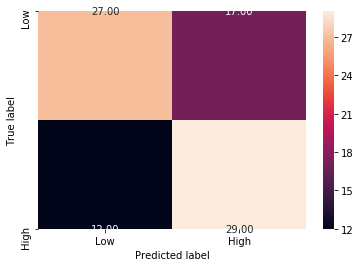

In [89]:
# Confusion matrix for 2 levels

cm5= metrics.confusion_matrix(Y_test_Levels, Y_predR4, ["Low","High"] )
print(cm5)
sns.heatmap(cm5, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

<b> 2 Levels based on mean

In [94]:
model5=abc2.fit(X_train, Y_train_2Levels)
Y_predR5= model5.predict(X_test)
print("Accuracy:",metrics.accuracy_score(Y_test_2Levels, Y_predR5))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.6235294117647059


# Ensemble Method
Since we observe that KNN, Random Forest and Linear Regression are the best performing algorithms so far, we combined the predictions of KNN, Random Forest and Linear Regression based on majority voting criteria to get a model with improved accuracy.

In [96]:
#KNN
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train,Y_train_Levels)
pred1=knn.predict(X_test)

#Random Forest
rdf=RandomForestClassifier(max_depth= 7, n_estimators= 800)
rdf.fit(X_train,Y_train_Levels.values.ravel())
pred2=rdf.predict(X_test)



C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  This is separate from the ipykernel package so we can avoid doing imports until


In [97]:
#Function to create levels as list
def create_2_levels_list(y):
    l=[]
    for i in y:
        if i<=-0.172165:
            l.append("Low")
        else:
            l.append("High")
    Levels=pd.DataFrame({"Vulnerablity_Levels":l}) 
    return l
#Linear regression
pred3= create_2_levels_list(Y_pred)

finalpred=[]
for i in range(0,len(X_test)): 
    if pred3[i]==pred2[i]==pred1[i]:
        finalpred.append(pred3[i])
    elif pred3[i]!=pred2[i]and pred2[i]==pred1[i] :
        finalpred.append(pred1[i])
    elif pred3[i]==pred2[i]and pred2[i]!=pred1[i]:
        finalpred.append(pred3[i])
    else:
        finalpred.append(pred3[i])

print("Accuracy:",metrics.accuracy_score(Y_test_Levels,finalpred))

Accuracy: 0.7764705882352941


[[34 10]
 [ 9 32]]


Text(0.5,28.3611,'Predicted label')

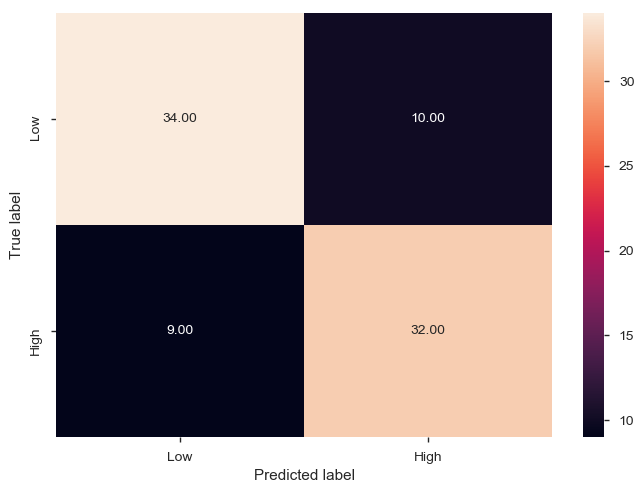

In [98]:
# Confusion matrix for 2 levels

cm6= metrics.confusion_matrix(Y_test_Levels,finalpred, ["Low","High"] )
print(cm6)
sns.heatmap(cm6, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Linear Discriminant Analysis (LDA)

In [99]:
#Prerparing data for LDA
lda_data=ff_data1.drop(['State_Name','State_District_Name'],axis=1)

#Outlier removal
j=lof().fit_predict(lda_data)
olda_data2= lda_data[j==1]
olda_data=pd.DataFrame(olda_data2)

#Dependent variable
Y_lda=olda_data['TT_Children_With_Birth_Weight_Less_Than_2_5_Kg_Total']
print(Y_lda.describe())

#Independent variables
olda_data1=olda_data.drop(['TT_Children_With_Birth_Weight_Less_Than_2_5_Kg_Total'],axis=1)

count    255.000000
mean      24.511686
std        8.755475
min        5.420000
25%       18.570000
50%       23.280000
75%       29.600000
max       54.700000
Name: TT_Children_With_Birth_Weight_Less_Than_2_5_Kg_Total, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


In [100]:
#Splitting into train and test 
X1_train, X1_test, Y1_train, Y1_test = model_selection.train_test_split(olda_data1, Y_lda, test_size = 0.33, random_state = 1234)


def create_2_levels_lda(y):
    l=[]
    for i in y:
        if i<=23.280000:
            l.append("Low")
        else:
            l.append("High")
    Levels=pd.DataFrame({"Vulnerablity_Levels":l}) 
    return Levels

Y1_train_Levels=create_2_levels_lda(Y1_train)
Y1_test_Levels=create_2_levels_lda(Y1_test)
print(X1_train.shape)
print(X1_test.shape)
print(Y1_train.shape)
print(Y1_test.shape)
print(Y1_train_Levels)

(170, 38)
(85, 38)
(170,)
(85,)
    Vulnerablity_Levels
0                   Low
1                  High
2                   Low
3                  High
4                  High
5                  High
6                  High
7                   Low
8                   Low
9                   Low
10                 High
11                  Low
12                 High
13                 High
14                 High
15                  Low
16                  Low
17                 High
18                  Low
19                  Low
20                 High
21                  Low
22                  Low
23                 High
24                 High
25                  Low
26                 High
27                  Low
28                 High
29                 High
..                  ...
140                High
141                 Low
142                High
143                 Low
144                High
145                High
146                High
147                 Low
148     

In [101]:
#Scaling
sc=StandardScaler()
X1_train_sc=sc.fit_transform(X1_train)
X1_test_sc=sc.transform(X1_test)

In [102]:
# Linear Discriminant Analysis 
lda=LDA(n_components=1)
train_X=lda.fit_transform(X1_train_sc,Y1_train_Levels)
test_X=lda.transform(X1_test_sc)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [103]:
X_tr,X_cv,y_tr,y_cv=model_selection.train_test_split(train_X,Y1_train_Levels,test_size=0.3,random_state=1234)
# now i have to determine the the valid k for which i have to fit training set(x_train) then predict the cross validation set(x_cv)
# from there deterimine which k gives down the best accuracy.
for i in range(1,50,2):
   
    # instantiate learning model (k=30)
    knn=KNeighborsClassifier(n_neighbors=i)
    # fitting the model in cross-validation train
    knn.fit(X_tr,y_tr)
    #predict the response of cross validation train
    predd=knn.predict(X_cv)
    
    # evaluate CV accuracy
    acc=accuracy_score(y_cv,predd,normalize=True)*float(100)
    print("Test accuracy for k","=", i," is ",acc)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  if __name__ == 

Test accuracy for k = 1  is  72.54901960784314
Test accuracy for k = 3  is  68.62745098039215
Test accuracy for k = 5  is  72.54901960784314
Test accuracy for k = 7  is  78.43137254901961
Test accuracy for k = 9  is  80.3921568627451
Test accuracy for k = 11  is  80.3921568627451
Test accuracy for k = 13  is  80.3921568627451
Test accuracy for k = 15  is  80.3921568627451
Test accuracy for k = 17  is  80.3921568627451
Test accuracy for k = 19  is  78.43137254901961
Test accuracy for k = 21  is  78.43137254901961
Test accuracy for k = 23  is  78.43137254901961
Test accuracy for k = 25  is  78.43137254901961
Test accuracy for k = 27  is  78.43137254901961
Test accuracy for k = 29  is  78.43137254901961
Test accuracy for k = 31  is  78.43137254901961
Test accuracy for k = 33  is  78.43137254901961
Test accuracy for k = 35  is  78.43137254901961
Test accuracy for k = 37  is  78.43137254901961
Test accuracy for k = 39  is  76.47058823529412
Test accuracy for k = 41  is  76.47058823529412
Te

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  if __name__ == '__main__':


In [104]:
# Now from above we could able to determine that for k=9 we are getting maximum accuracy in cross validation dataset
# Now we apply it on the test dataset
linear_discriminant_classifier=KNeighborsClassifier(n_neighbors=9)
linear_discriminant_classifier.fit(X1_train,Y_train_Levels)
pred=linear_discriminant_classifier.predict(X_test)
acc=accuracy_score(Y_test_2Levels,pred,normalize=True)*float(100)
print('Test accuracy for k=9',"is",acc)

Test accuracy for k=9 is 56.470588235294116


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  after removing the cwd from sys.path.


In [105]:
ldaclassifier=RandomForestClassifier(max_depth= 7, n_estimators= 800)
ldaclassifier.fit(train_X,Y1_train_Levels.values.ravel())
ldaclassifierpred=ldaclassifier.predict(test_X)
print("Accuracy:",metrics.accuracy_score(Y1_test_Levels,ldaclassifierpred))

Accuracy: 0.6823529411764706


[[33 14]
 [13 25]]


Text(0.5,28.3611,'Predicted label')

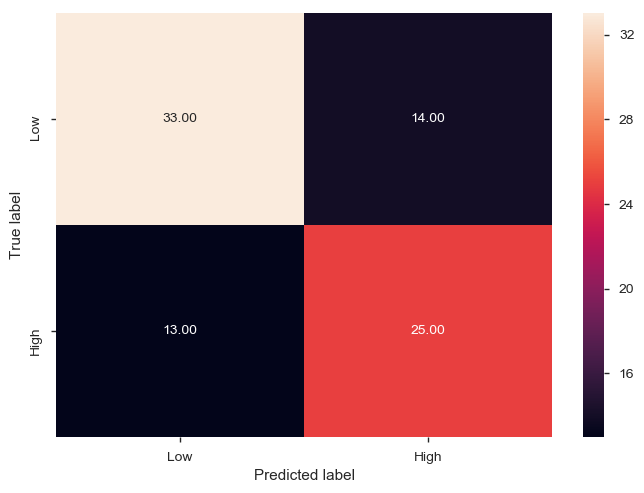

In [106]:
# Confusion matrix for 2 levels

cm7= metrics.confusion_matrix(Y1_test_Levels,ldaclassifierpred, ["Low","High"] )
print(cm7)
sns.heatmap(cm7, annot=True,  fmt='.2f', xticklabels = ["Low", "High"] , yticklabels = ["Low", "High"] )
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Data Visualization

In [110]:
# Creating Box plots for viewing the distribution of data points into both levels with respect to individual features
Y=create_2_levels(Y1)
ff_data3=pd.concat([ff,Y],axis=1)
ff_data3.head()

,BB_Average_Household_Size_St_Total,BB_Average_Household_Size_All_Total,BB_Currently_Married_Illiterate_Women_Aged_15_49_Years_Total,CC_Sex_Ratio_At_Birth_Total,CC_Sex_Ratio_All_Ages_Total,DD_Female_Total,EE_Marriages_Among_Females_Below_Legal_Age_18_Years_Total,EE_Currently_Married_Women_Aged_20_24_Years_Married_Before_Legal_Age_18_Years_Total,EE_Mean_Age_At_Marriage_Female_Total,GG_Work_Participation_Rate_15_Years_And_Above_Female_Total,...,PP_Mothers_Who_Had_Full_Antenatal_Check_Up_Total,PP_Mothers_Who_Received_Anc_From_Govt_Source_Total,QQ_Institutional_Delivery_Total,QQ_Delivery_At_Private_Institution_Total,QQ_Delivery_At_Home_Total,QQ_Delivery_At_Home_Conducted_By_Skilled_Health_Personnel_Total,SS_Mothers_Who_Availed_Financial_Assistance_For_Delivery_Under_Jsy_Total,AA_percent_urban,AA_Currently_Married_Women_Aged_15_49_Years_Total_percent,Vulnerablity_Levels
0,4.7,4.7,31.7,926.0,947.0,71.6,6.4,21.5,21.7,8.4,...,14.0,89.6,52.3,7.3,47.4,19.8,41.8,6.899570,18.382194,Low
1,4.7,4.8,32.8,950.0,955.0,72.9,7.8,42.8,21.7,9.5,...,16.3,92.9,54.8,5.5,45.1,34.8,51.7,14.265992,18.489025,Low
2,4.1,4.6,20.0,928.0,995.0,80.3,3.9,24.2,22.6,15.0,...,17.8,50.3,64.8,10.3,34.9,35.7,53.0,11.936118,16.936410,High
3,4.9,4.9,44.1,1003.0,955.0,66.8,8.5,40.5,22.1,14.6,...,17.1,91.3,63.0,5.3,36.6,24.0,54.3,3.058310,17.305839,High
4,5.7,5.2,29.9,988.0,954.0,74.4,9.3,29.4,21.5,18.1,...,11.0,92.4,72.3,2.7,27.1,24.9,76.3,12.858228,17.930843,Low


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


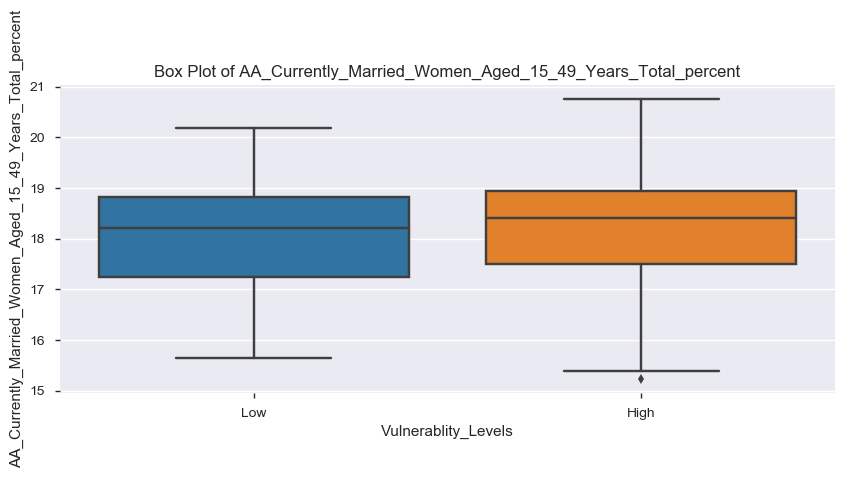

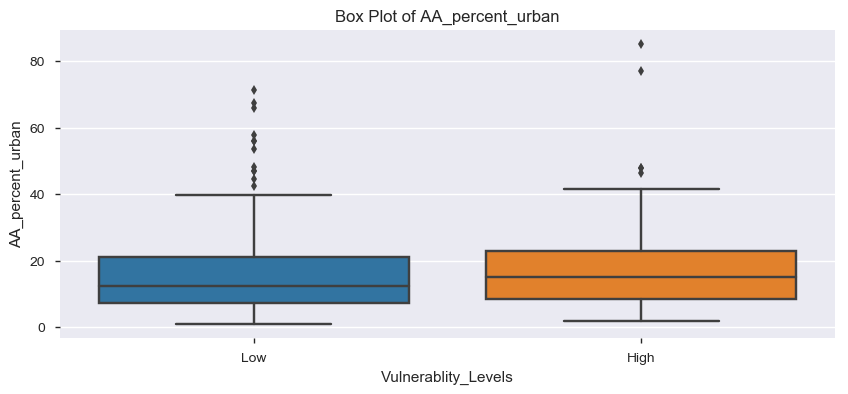

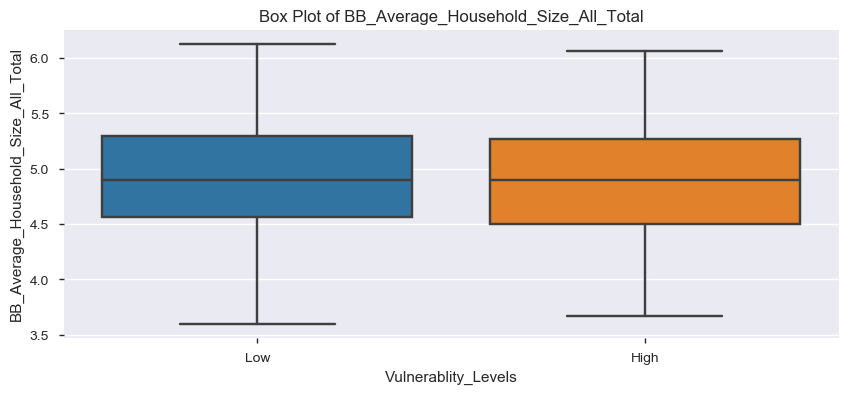

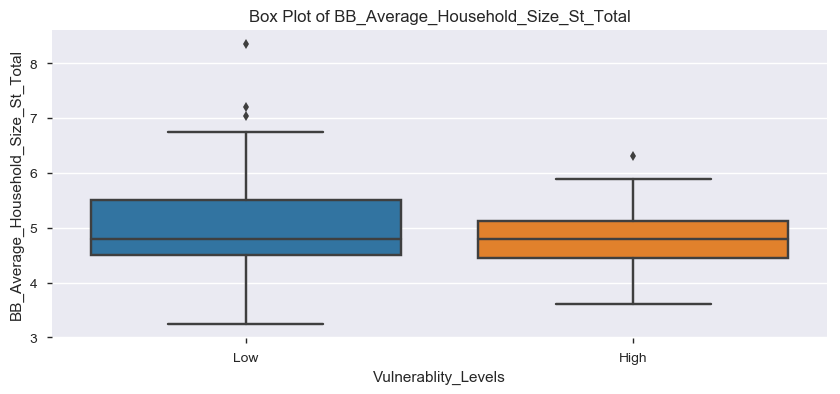

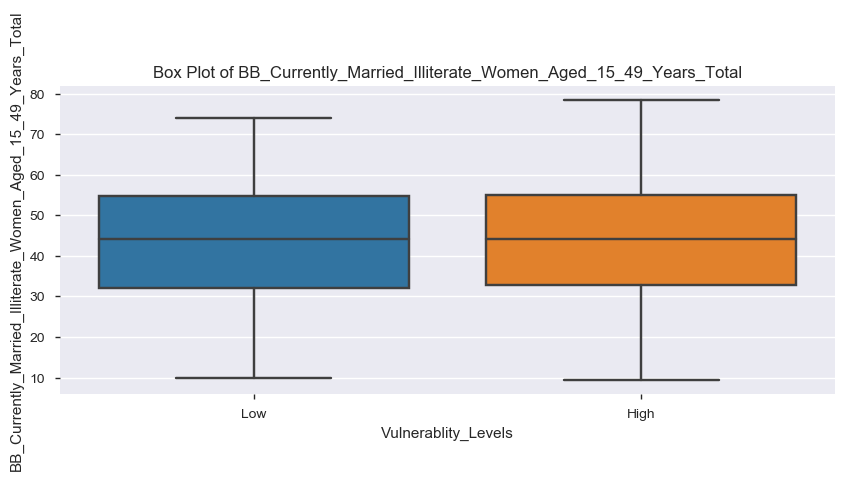

...

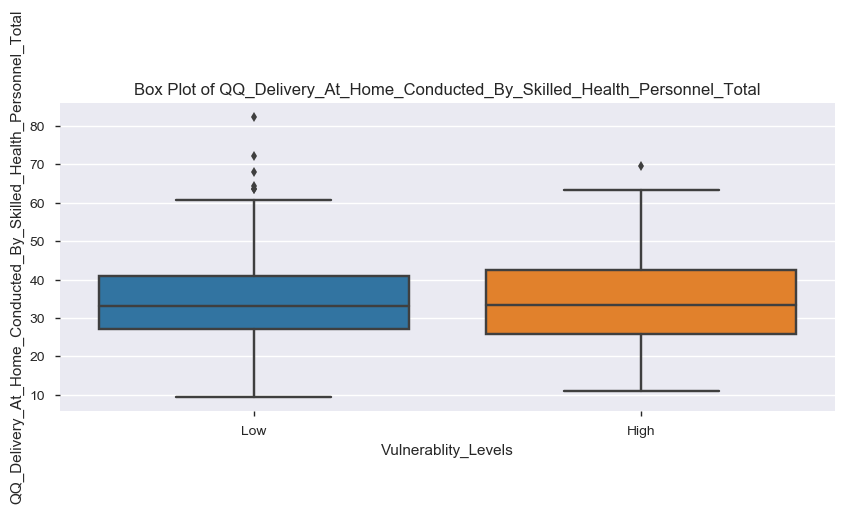

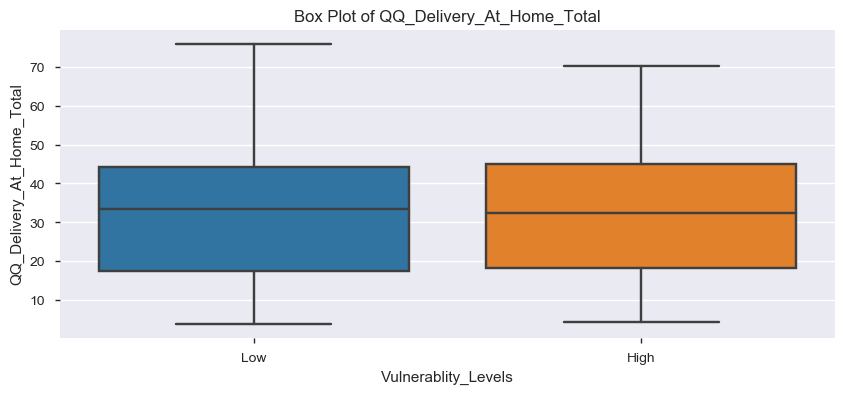

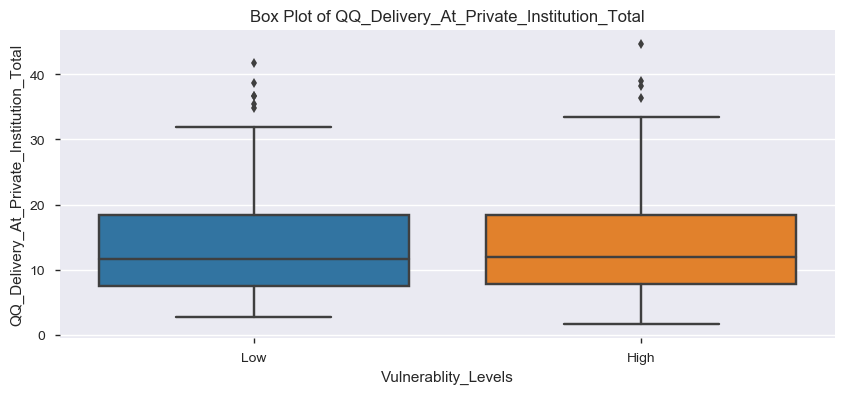

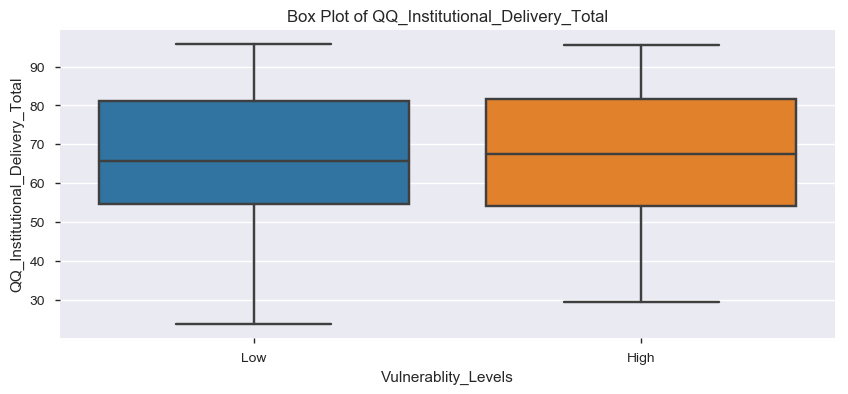

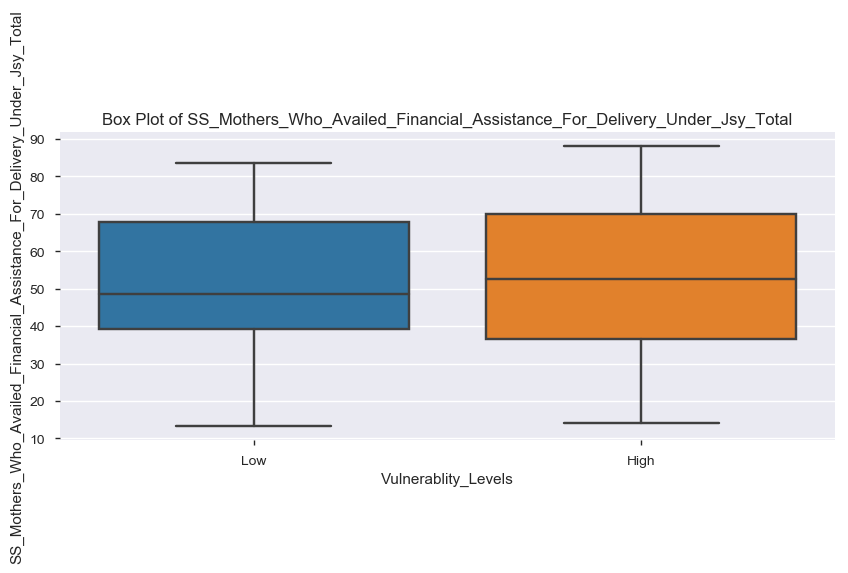

In [111]:
for num_variable in ff_data3.columns.difference(['Vulnerablity_Levels']):
    fig,axes = plt.subplots(figsize=(10,4))
    sns.boxplot(x='Vulnerablity_Levels', y=num_variable, data = ff_data3)
    plt.title(str('Box Plot of ') + str(num_variable))


In [112]:
# Creating Box plots for viewing the distribution of data points into 3 levels with respect to individual features
Y=create_3_levels(Y1)
ff_data3=pd.concat([ff,Y],axis=1)
ff_data3.head()

,BB_Average_Household_Size_St_Total,BB_Average_Household_Size_All_Total,BB_Currently_Married_Illiterate_Women_Aged_15_49_Years_Total,CC_Sex_Ratio_At_Birth_Total,CC_Sex_Ratio_All_Ages_Total,DD_Female_Total,EE_Marriages_Among_Females_Below_Legal_Age_18_Years_Total,EE_Currently_Married_Women_Aged_20_24_Years_Married_Before_Legal_Age_18_Years_Total,EE_Mean_Age_At_Marriage_Female_Total,GG_Work_Participation_Rate_15_Years_And_Above_Female_Total,...,PP_Mothers_Who_Had_Full_Antenatal_Check_Up_Total,PP_Mothers_Who_Received_Anc_From_Govt_Source_Total,QQ_Institutional_Delivery_Total,QQ_Delivery_At_Private_Institution_Total,QQ_Delivery_At_Home_Total,QQ_Delivery_At_Home_Conducted_By_Skilled_Health_Personnel_Total,SS_Mothers_Who_Availed_Financial_Assistance_For_Delivery_Under_Jsy_Total,AA_percent_urban,AA_Currently_Married_Women_Aged_15_49_Years_Total_percent,Vulnerablity_Levels
0,4.7,4.7,31.7,926.0,947.0,71.6,6.4,21.5,21.7,8.4,...,14.0,89.6,52.3,7.3,47.4,19.8,41.8,6.899570,18.382194,Medium
1,4.7,4.8,32.8,950.0,955.0,72.9,7.8,42.8,21.7,9.5,...,16.3,92.9,54.8,5.5,45.1,34.8,51.7,14.265992,18.489025,Medium
2,4.1,4.6,20.0,928.0,995.0,80.3,3.9,24.2,22.6,15.0,...,17.8,50.3,64.8,10.3,34.9,35.7,53.0,11.936118,16.936410,Medium
3,4.9,4.9,44.1,1003.0,955.0,66.8,8.5,40.5,22.1,14.6,...,17.1,91.3,63.0,5.3,36.6,24.0,54.3,3.058310,17.305839,Medium
4,5.7,5.2,29.9,988.0,954.0,74.4,9.3,29.4,21.5,18.1,...,11.0,92.4,72.3,2.7,27.1,24.9,76.3,12.858228,17.930843,Low


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


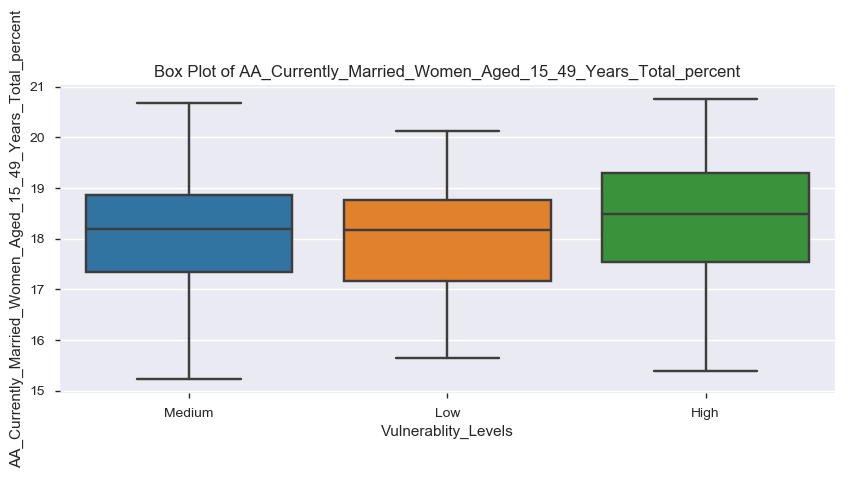

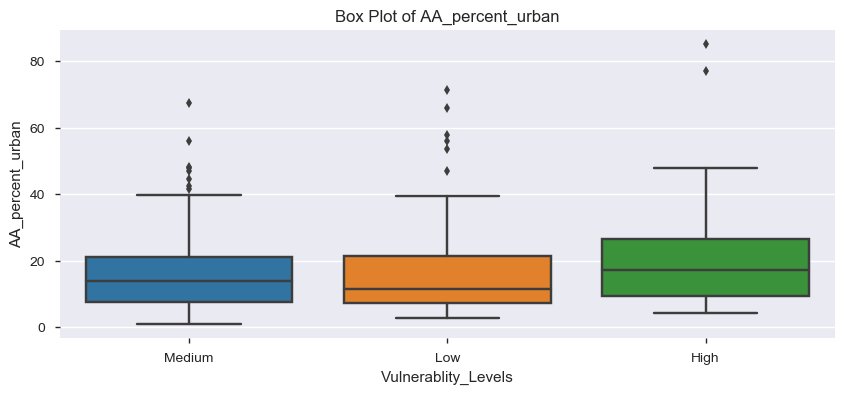

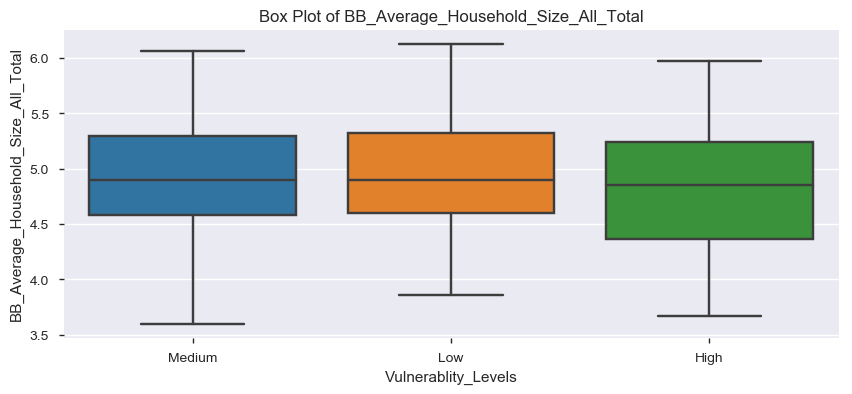

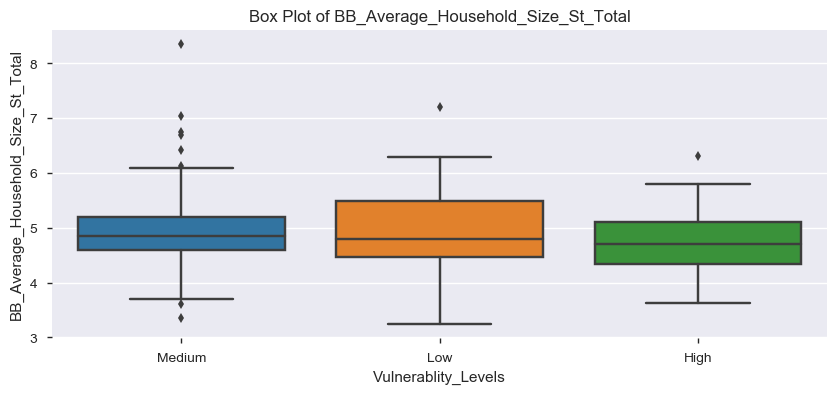

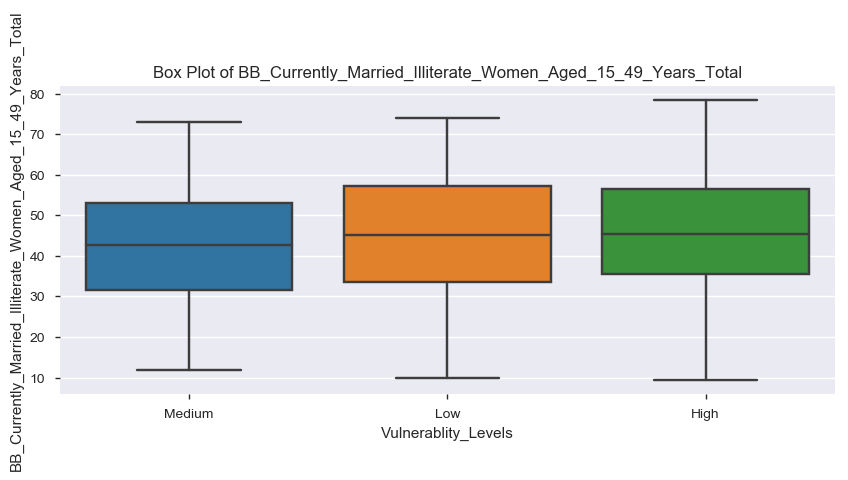

...

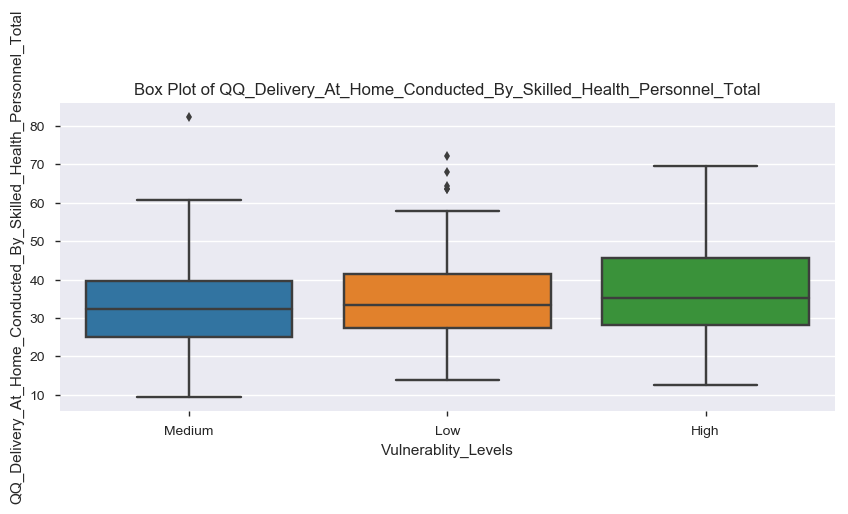

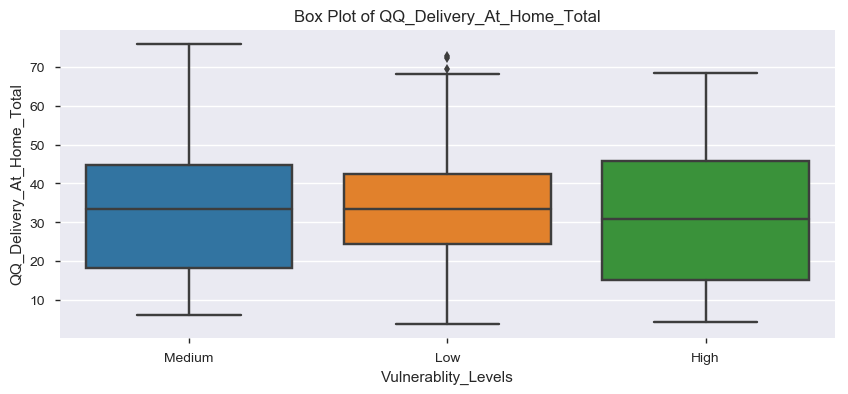

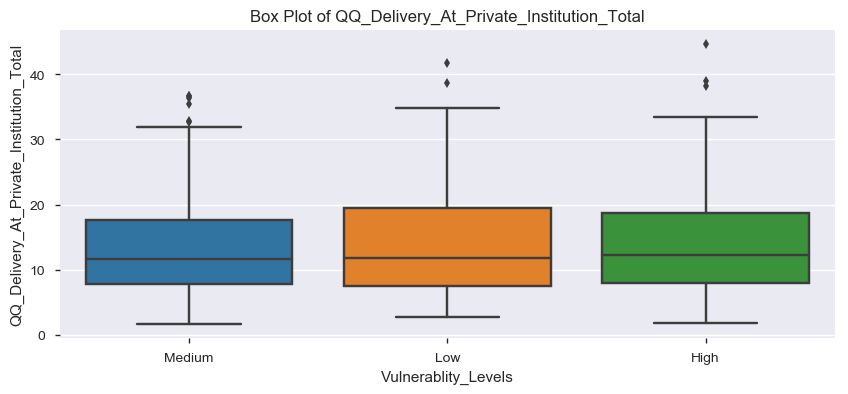

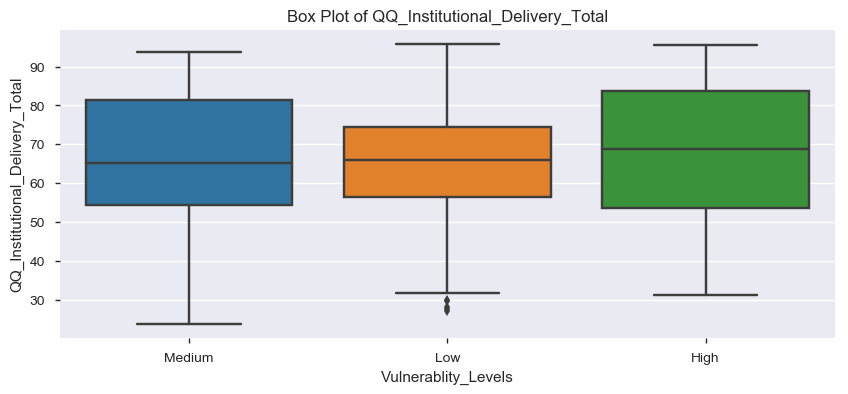

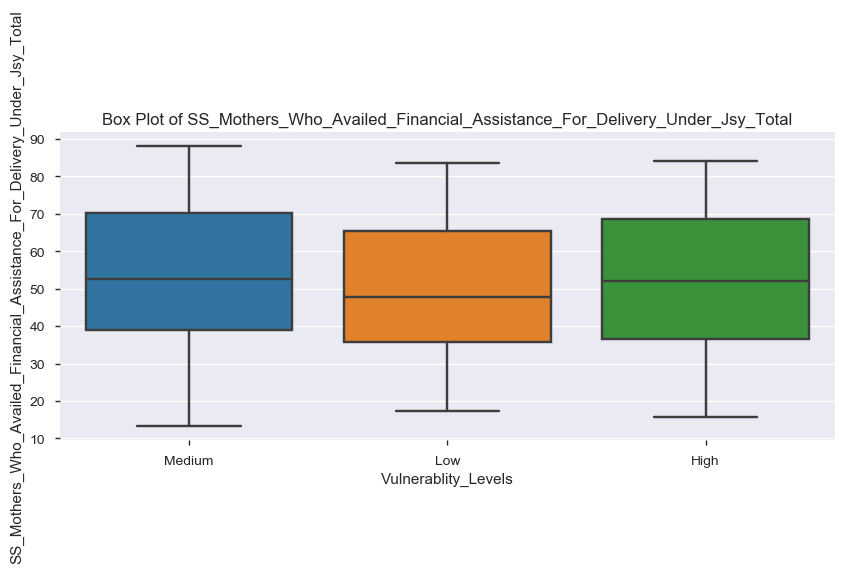

In [113]:
for num_variable in ff_data3.columns.difference(['Vulnerablity_Levels']):
    fig,axes = plt.subplots(figsize=(10,4))
    sns.boxplot(x='Vulnerablity_Levels', y=num_variable, data = ff_data3)
    plt.title(str('Box Plot of ') + str(num_variable))


In [115]:
# Creating Box plots for viewing the distribution of data points into 4 levels with respect to individual features
Y=create_4_levels(Y1)
ff_data3=pd.concat([ff,Y],axis=1)
ff_data3.head()

,BB_Average_Household_Size_St_Total,BB_Average_Household_Size_All_Total,BB_Currently_Married_Illiterate_Women_Aged_15_49_Years_Total,CC_Sex_Ratio_At_Birth_Total,CC_Sex_Ratio_All_Ages_Total,DD_Female_Total,EE_Marriages_Among_Females_Below_Legal_Age_18_Years_Total,EE_Currently_Married_Women_Aged_20_24_Years_Married_Before_Legal_Age_18_Years_Total,EE_Mean_Age_At_Marriage_Female_Total,GG_Work_Participation_Rate_15_Years_And_Above_Female_Total,...,PP_Mothers_Who_Had_Full_Antenatal_Check_Up_Total,PP_Mothers_Who_Received_Anc_From_Govt_Source_Total,QQ_Institutional_Delivery_Total,QQ_Delivery_At_Private_Institution_Total,QQ_Delivery_At_Home_Total,QQ_Delivery_At_Home_Conducted_By_Skilled_Health_Personnel_Total,SS_Mothers_Who_Availed_Financial_Assistance_For_Delivery_Under_Jsy_Total,AA_percent_urban,AA_Currently_Married_Women_Aged_15_49_Years_Total_percent,Vulnerablity_Levels
0,4.7,4.7,31.7,926.0,947.0,71.6,6.4,21.5,21.7,8.4,...,14.0,89.6,52.3,7.3,47.4,19.8,41.8,6.899570,18.382194,Medium
1,4.7,4.8,32.8,950.0,955.0,72.9,7.8,42.8,21.7,9.5,...,16.3,92.9,54.8,5.5,45.1,34.8,51.7,14.265992,18.489025,Medium
2,4.1,4.6,20.0,928.0,995.0,80.3,3.9,24.2,22.6,15.0,...,17.8,50.3,64.8,10.3,34.9,35.7,53.0,11.936118,16.936410,High
3,4.9,4.9,44.1,1003.0,955.0,66.8,8.5,40.5,22.1,14.6,...,17.1,91.3,63.0,5.3,36.6,24.0,54.3,3.058310,17.305839,High
4,5.7,5.2,29.9,988.0,954.0,74.4,9.3,29.4,21.5,18.1,...,11.0,92.4,72.3,2.7,27.1,24.9,76.3,12.858228,17.930843,Low


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


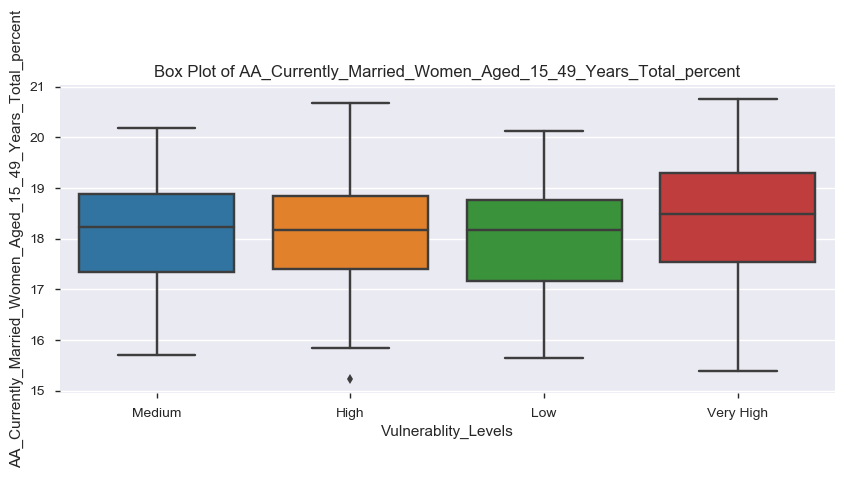

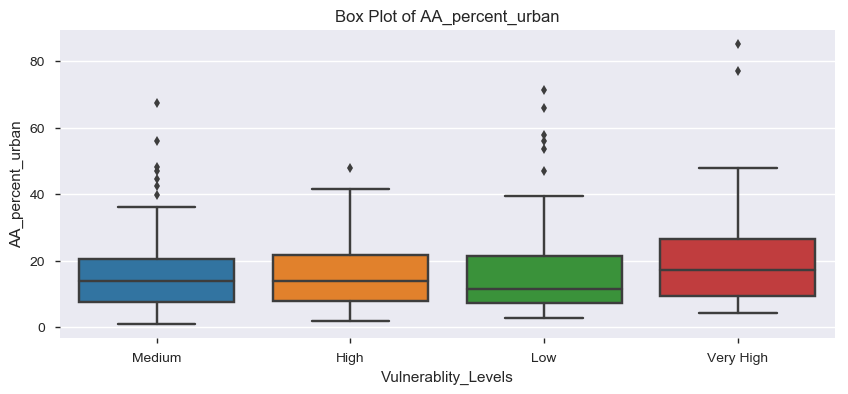

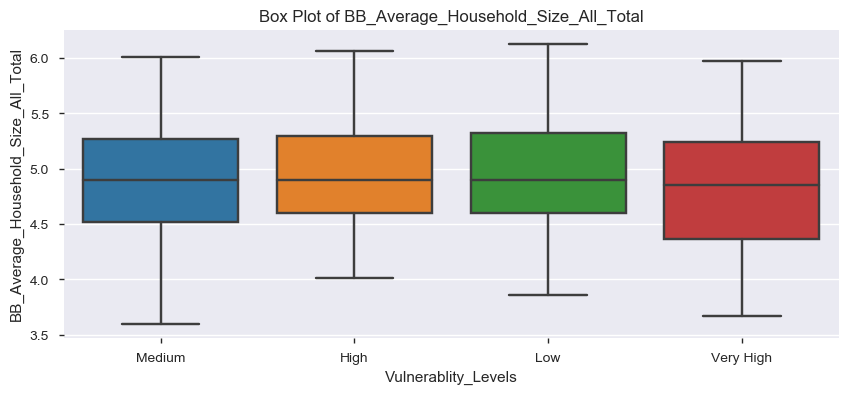

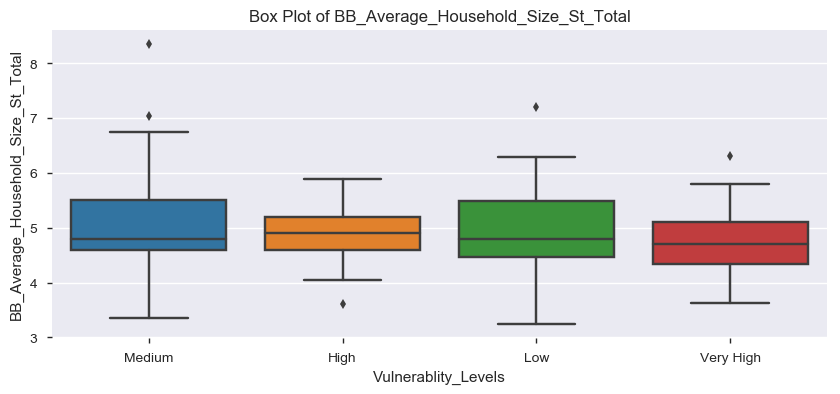

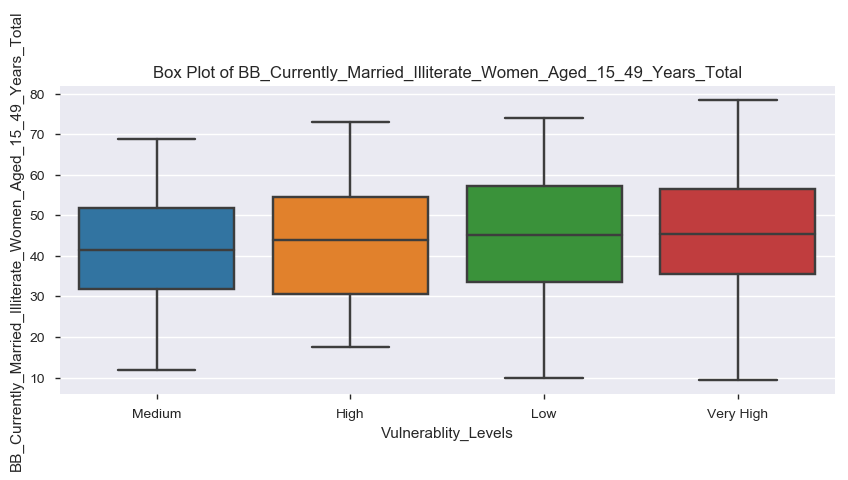

...

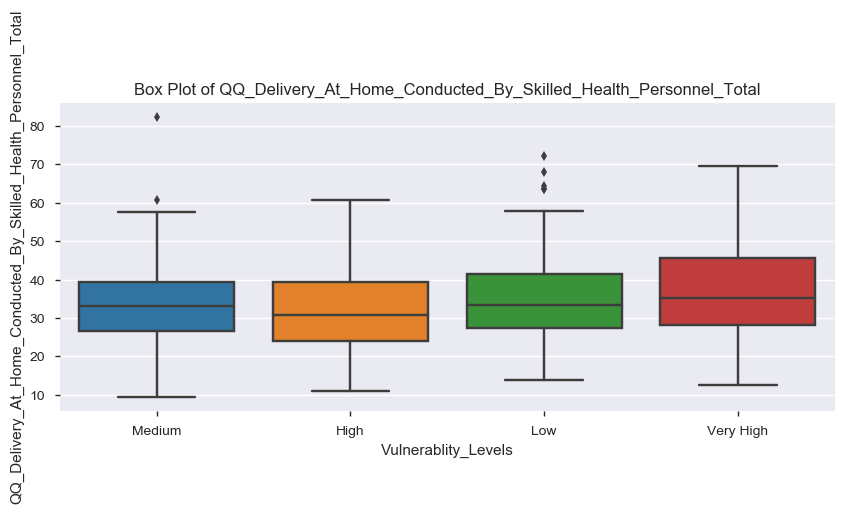

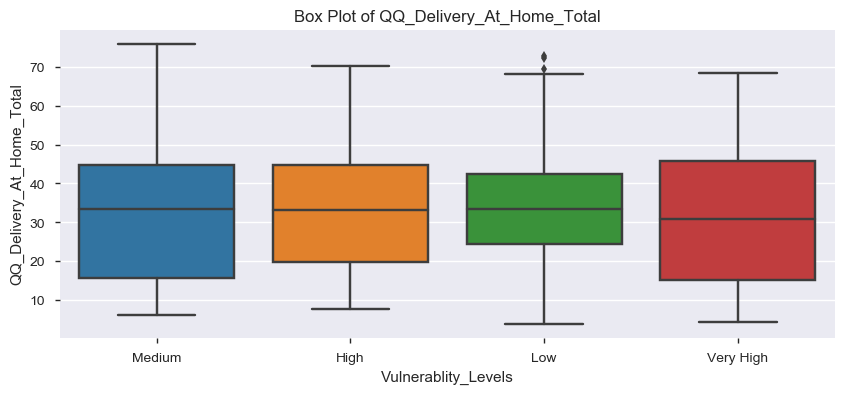

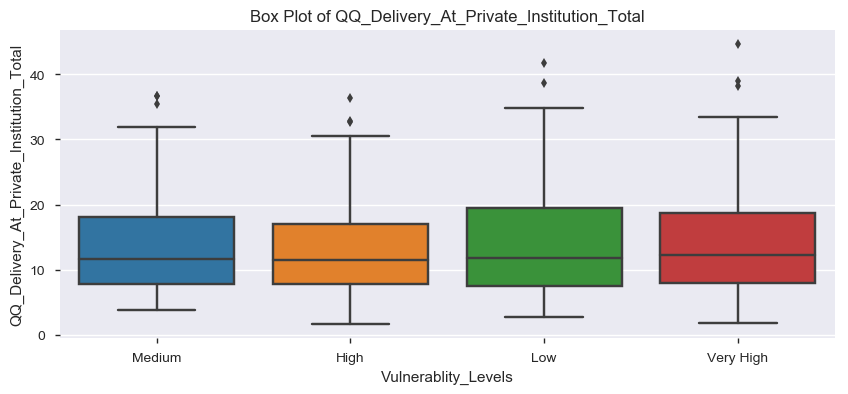

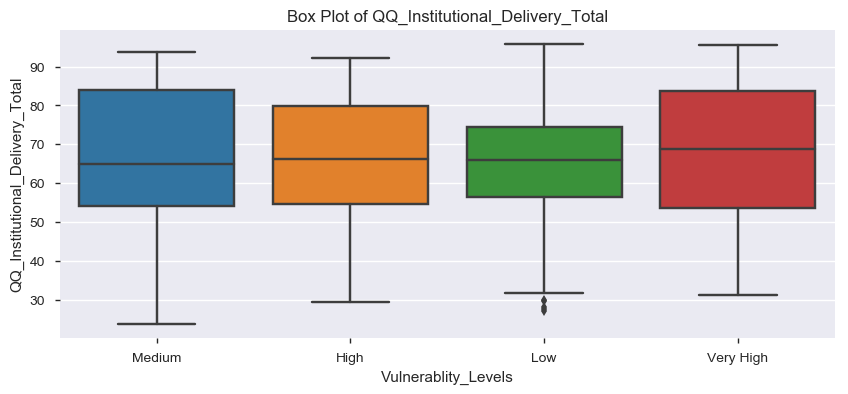

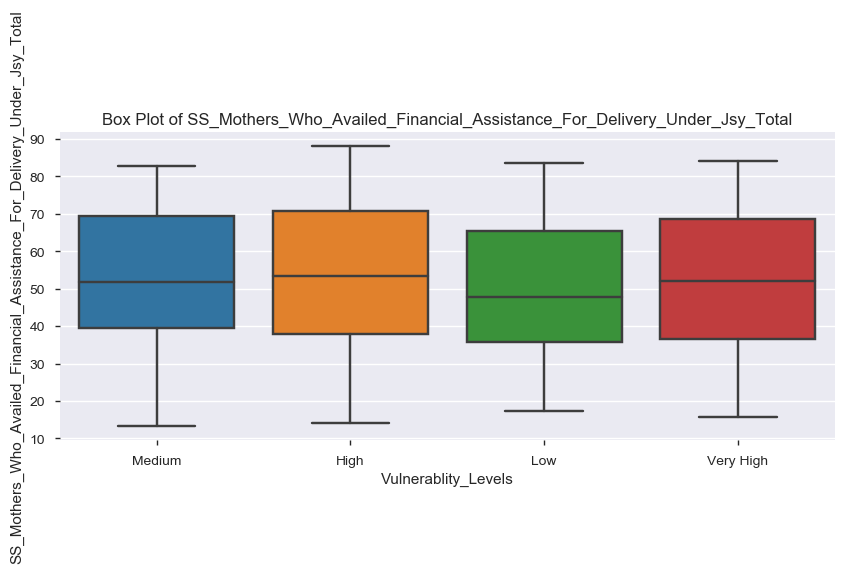

In [116]:
for num_variable in ff_data3.columns.difference(['Vulnerablity_Levels']):
    fig,axes = plt.subplots(figsize=(10,4))
    sns.boxplot(x='Vulnerablity_Levels', y=num_variable, data = ff_data3)
    plt.title(str('Box Plot of ') + str(num_variable))
